**Project 1:**

In this project we are modelling a bicycle model which has a state x(t) which consists of state variaibles x, y , theta and v where x and y are the 2 dimensional co-ordinates of the bicycle, theta is the heading angle or the direction in which the bicycle is pointing with respect to the origin and the v is the velocity of the bicycle.

The state vaiables are controlled by the dependant variables or the action variables. In this case action variables are the acceleration and steering angle.

# <center> The discreet dynamics is as follows: <center/>


$x$(t+1) = $x(t)$ + $v$ * $cos$ ($\theta$+$\beta$)*$\Delta$t

$y$(t+1) = $y(t)$ + $v$ * $sin$ ($\theta$+$\beta$)*$\Delta$t

$\theta$(t+1) = $\theta(t)$ + $v$ * $tan$ ($\delta$)*$cos(\beta)$$\Delta$t/L

$v$(t+1) = $v(t)$ +$a$ * $\Delta$t

The action variables are as follows:

$u(t)$ = [$a(t)$ $\delta(t)$]

The variable $\beta$ = $tan^{-1}(tan(\delta)/2)$

The varaibles $l_r$ and $l_f$ are the lengths of the bicycle from the center to the rear and the front axles


In this project following is the optimization problem that we are solving:

$min ||X(t)||^2 $ -  This cost function tries to minimize the distance from the starting state to the state described in the cost function. We are basically trying to drive the bicycle from its starting state to the state mentioned in the function.

We will also introduce a penalty term to create obstacle avoidance. In this case e create a circular region which needs to be avoided.In the code further we will show how this is done.

In this program we use a neural network that takes the state as the input and outputs the next action variables, these action variables are then used to calculate the next state which is then again fed into the neural network to find the next action variables and this loop continues n number of times where n is a number that we can se. In this case we have set n to be 100.

The automatic differentiation used in this program is done with the help of pytorch

In [4]:
!pip install jupyterthemes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 5.9 MB/s eta 0:00:00


In [5]:
import logging
import math
import random
import numpy as np
import time
import torch
import torch.nn as nn
from torch import optim
from torch.nn import utils
import matplotlib.pyplot as plt
from ipywidgets import IntProgress
from IPython.display import display
from matplotlib import pyplot as plt, rc
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation, PillowWriter
from jupyterthemes import jtplot

In [6]:
# environment parameters
frame_time = 0.2 #time interval(seconds)
lr = 0.5 # Length of rear axle to the center(meters)
lf = 0.5 # Length of front axle to the center(meters)



In the below block of code we have four key classes that are important to understand about how this code operates, following are the classes:

1. Dynamics
2. Controller
3. Simulation
4. Optimize

and finally we define the hyperparameters.

Lets look at each of these sections in more detail.

The dynamics section is in which we have made most of the changes.To ensure that backpropagation is possible throuch the pytorch tensor we need to ensure that we do not overwrite any of the state variables.

We create multiple tensors which we will go over and use element-wise multiplication and addition to find the state values of the next state using the previous state values and the action values.

1. state_tensor = [$cos(θ)$,$sin(θ)$,$tan(δ)$,0]
2. state_theta = [$sin(θ)$,$cos(θ)$,0,0]
3. cos_tensor = [$cos(β)$,$cos(β)$,$cos(β)$,0]
4. sin_tensor = [$sin(β)$,$sin(β)$,0,0]
5. velocity_mat = [$v$,$v$,$v$,0]
6. angle_tensor= cos_tensor * state_tensor + sin_tensor * state_theta = [$cos(β)$$cos(θ)$ + $sin(β)$$sin(θ)$,$cos(β)$$sin(θ)$ + $sin(β)$$cos(θ)$,$cos(β)$$tan(δ)$,0]

using trignometry functions this becomes:

angle_tensor= [$cos$ ($\theta$+$\beta$),$sin$ ($\theta$+$\beta$),$cos(β)$$tan(δ)$,0 ]

7. inter_mat = velocity_mat * angle_tensor = [$v$ * $cos$ ($\theta$+$\beta$),$v$ * $sin$ ($\theta$+$\beta$), $v$ * $cos(β)$$tan(δ)$,0 ]

8. accel_tensor = [0,0,0,$a$]
9. final_state = frame_time*[inter_mat + accel_tensor]

=[$v$ * $cos$ ($\theta$+$\beta$) * $\Delta t$,$v$ * $sin$ ($\theta$+$\beta$) * $\Delta t$, $v$ * $cos(β)$$tan(δ)$ * $\Delta t$,$a$ * $\Delta t$ ]

This final state gets added to the current state values to give us the state values of the next state.

In the next section we have the controller:

In this section we run the neural network with the states as the input and the action variables as the output.

We have 2 hidden layers with 8 neurons in each hidden layer and the output layer has a sigmoid activation which means that the output values will be from 0 to 1. We need the out put values to be from -1 to 1 and hence we modify the outputs with the following line of code: $(action - torch.tensor([0.5, 0.5]))*2$

In the next section we have the simulation class:

In this section we run the controller and dynamics classes in a loop based on the number of iterations defined by the user, here we have set it as 100. These 100 iterations represent 1 epoch. It is also important note that at the end of the 100 iterations, the objective function is returned as the loss value. The program then back propagates through the system adjusting the parameters based on this loss function and then runs the next epoch to improve the outcome based on the loss function.

In the code below we are trying to avoid an obstacle which is a circle. Our objective is two fold, we want our bicycle to drive towards the point (-4,3) and also upon reaching the point the heading angle and the velocity needs to be zero. As we reach closer to the final point our objective decreases. The loss for this objective is the square of the distance between the current point and the final point that we want.

The other part of the objective is avoiding and obstacle which is a circle with a radius of 2.23 and centered around the point 3,3. To ensure that our bicycle does not drive into the circle we take every point along its trajectory and find its distance from the center of the circle and then subtract that from the radius of the circle and then take the exponent of this vector. As long as the trajectory is outside the circle this value will be very low as the exponent of a negative number will be close to 0. If we enter the circle this value becomes positive and the value of the exponent increases the loss function. We also multiply the mean of this vector by 100 to give this part of the loss function some importance.

The final equation looks like this for the obstacle avoidance part:

$torch.tensor(100)*torch.mean(torch.exp(torch.tensor(2.236068)-torch.sqrt((torch.tensor(3)-x1)**2+(torch.tensor(3)-y1)**2)))$

Finally we have the optimize class:

In this section we initialize the optimizer, we use the LBFGS optimizer.

We also call the simulation class from here and back propagate through the parameters of the neural network. We run through all the epochs in this class and generate the graphs for each iteration of the epoch.

We finally create an animation of the bicycle moving through the trajectory!



In [31]:
#do nothing

[1] loss: 20.481


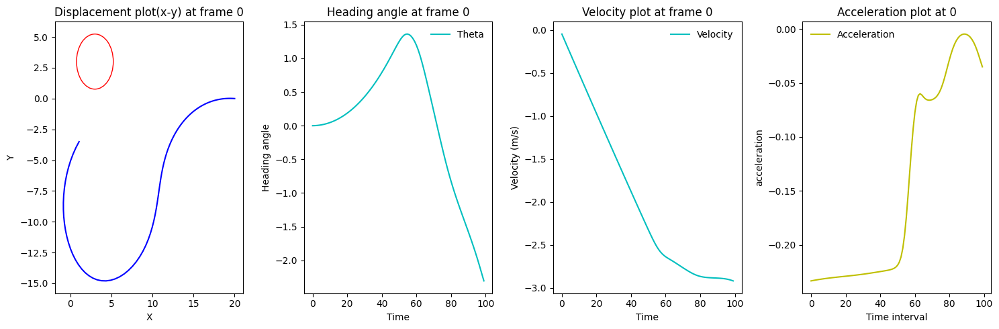

[2] loss: 10.146


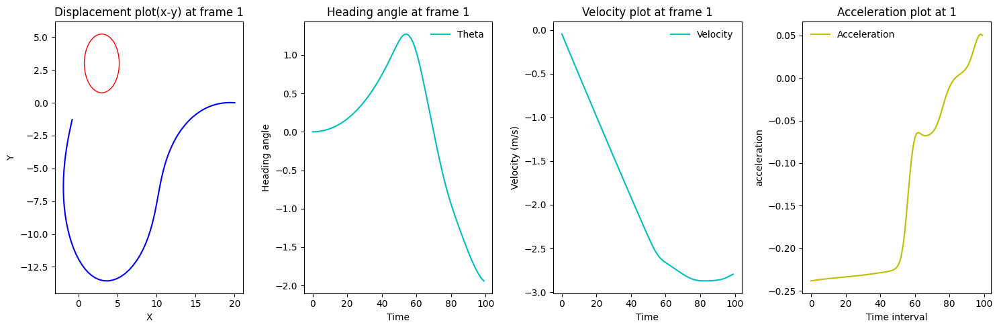

[3] loss: 6.125


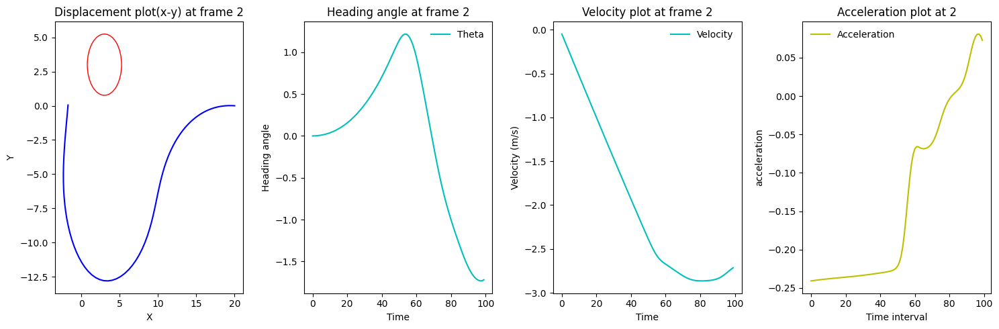

[4] loss: 4.425


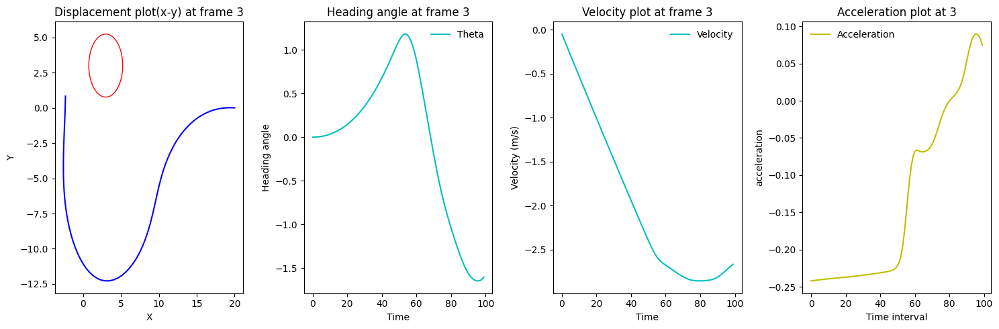

[5] loss: 3.515


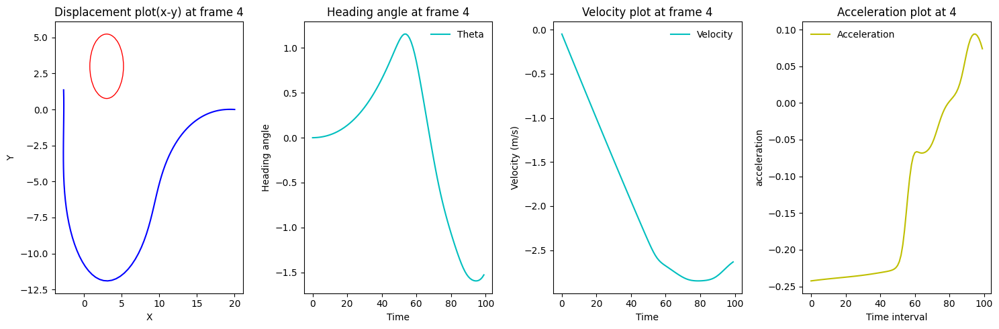

[6] loss: 2.985


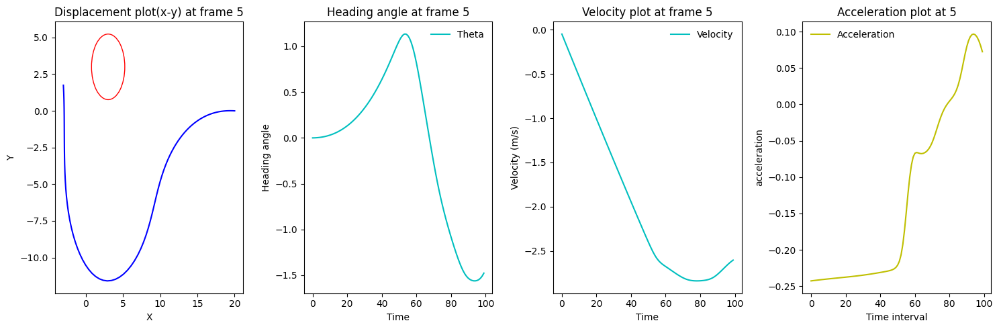

[7] loss: 2.656


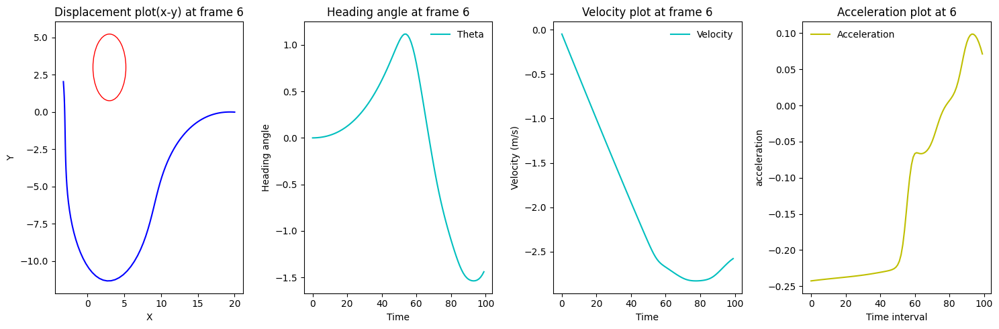

[8] loss: 2.437


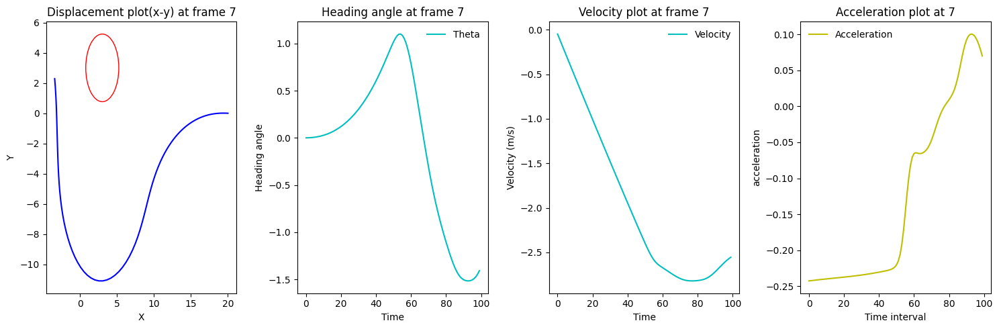

[9] loss: 2.284


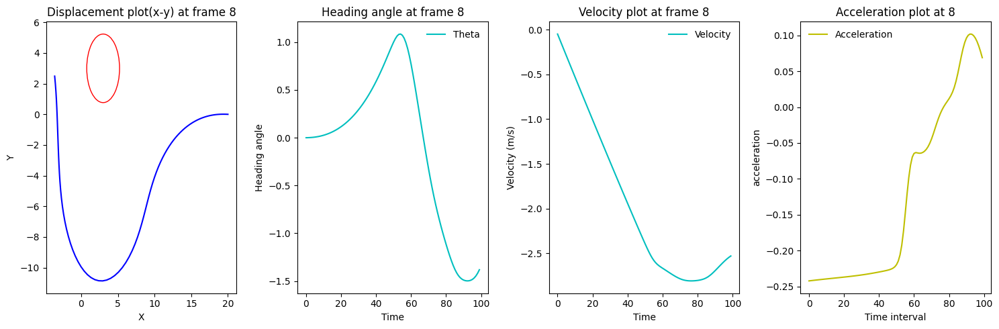

[10] loss: 2.175


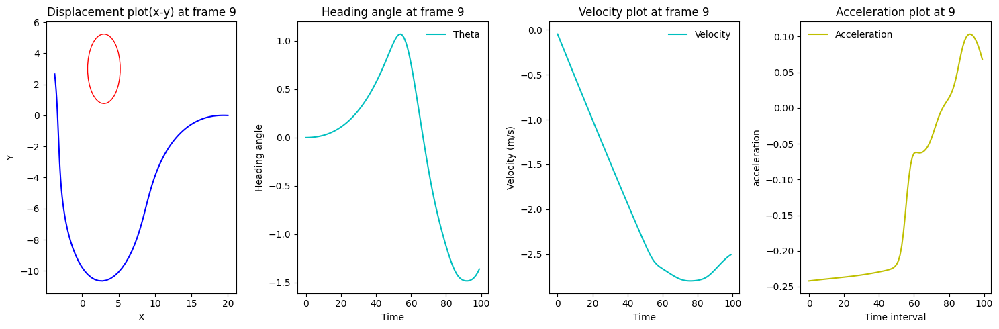

[11] loss: 2.097


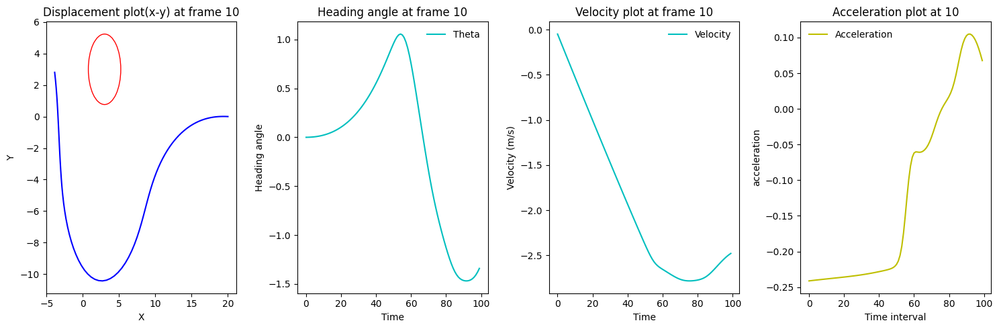

[12] loss: 2.034


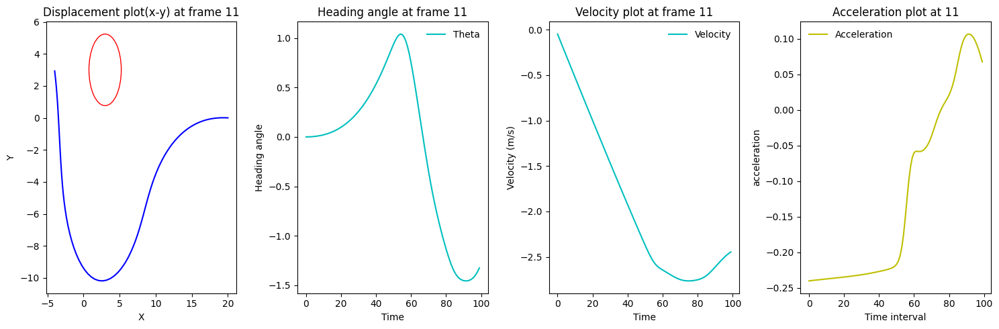

[13] loss: 1.973


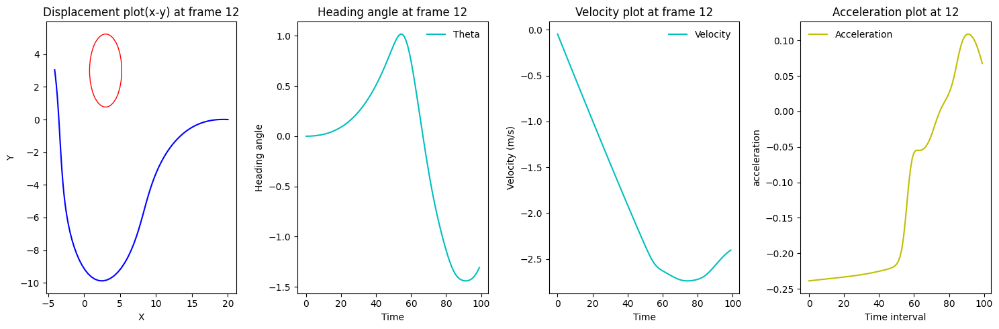

[14] loss: 1.903


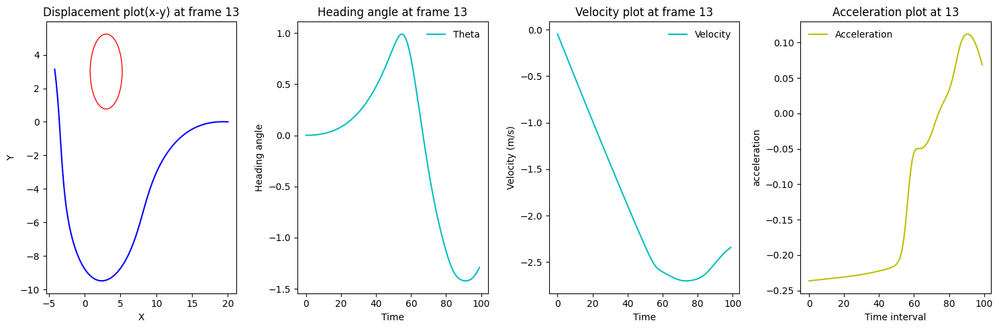

[15] loss: 1.802


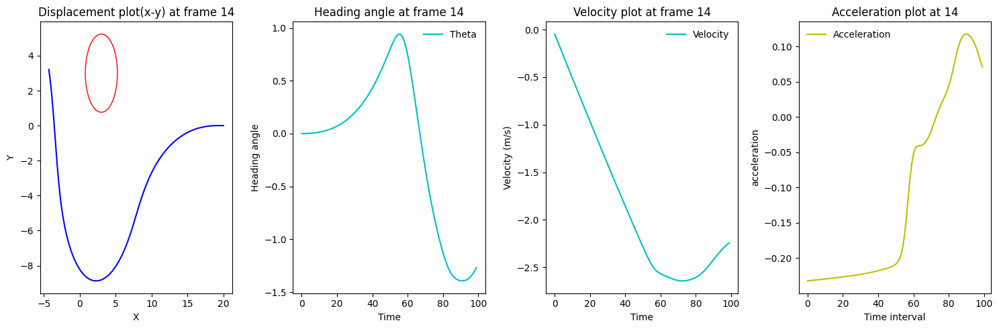

[16] loss: 1.551


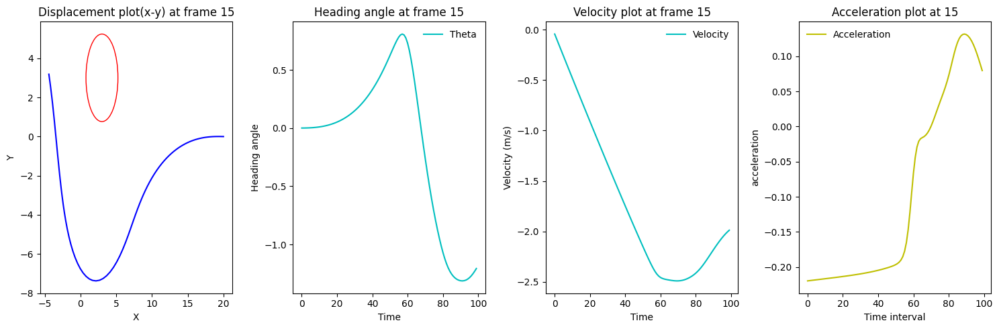

[17] loss: 1.349


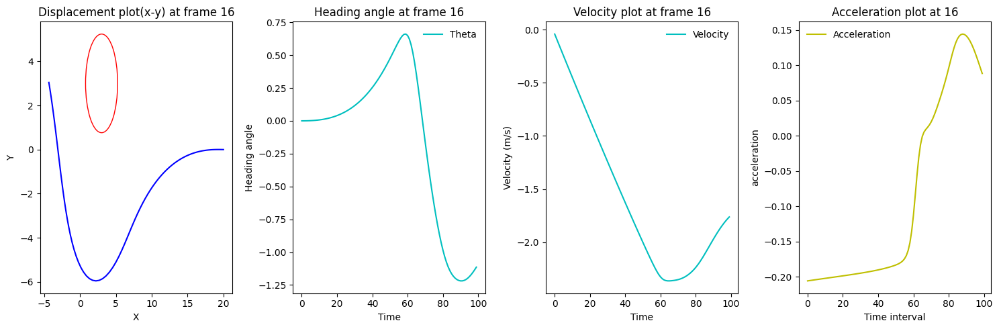

[18] loss: 1.286


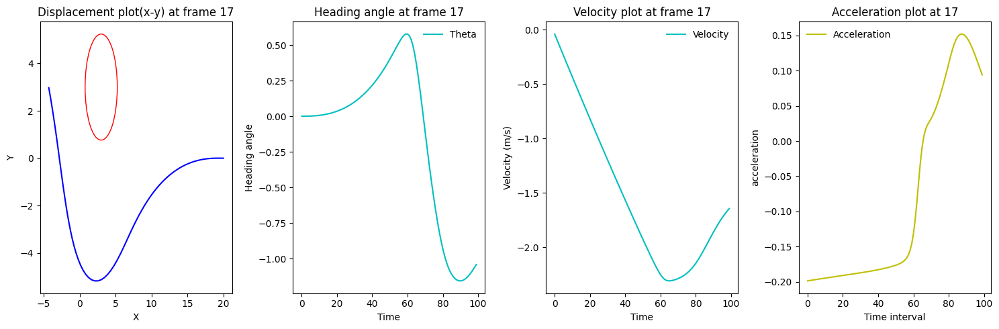

[19] loss: 1.261


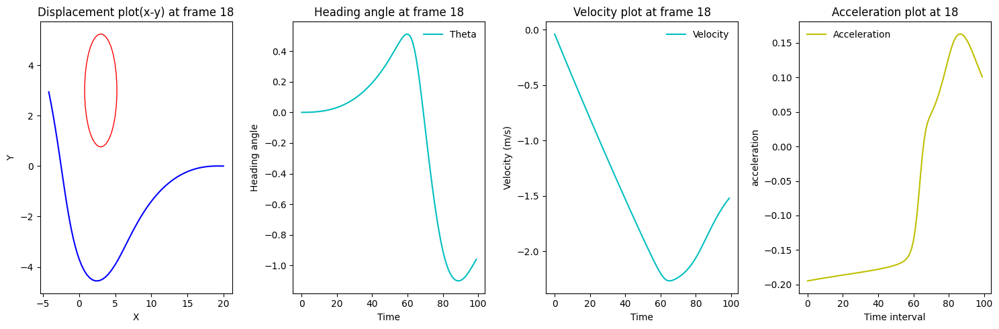

[20] loss: 1.221


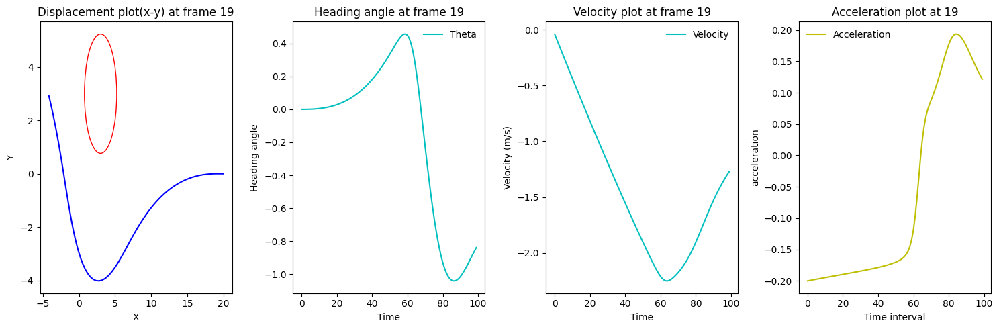

[21] loss: 1.213


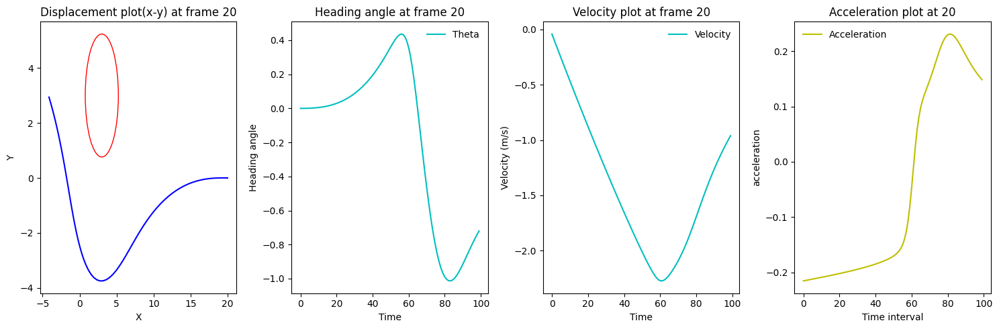

[22] loss: 1.287


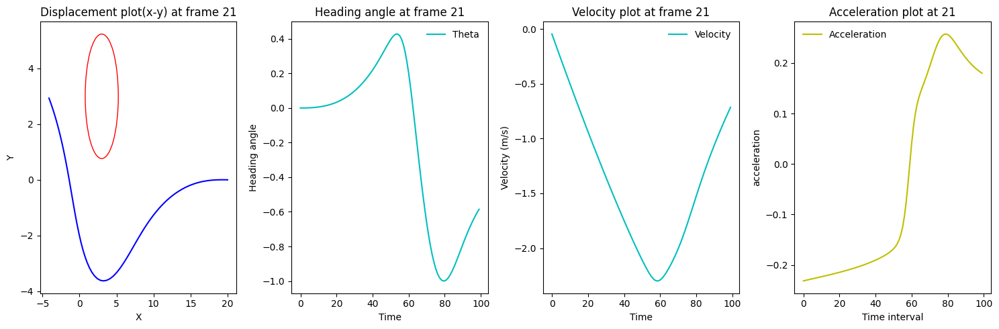

[23] loss: 1.464


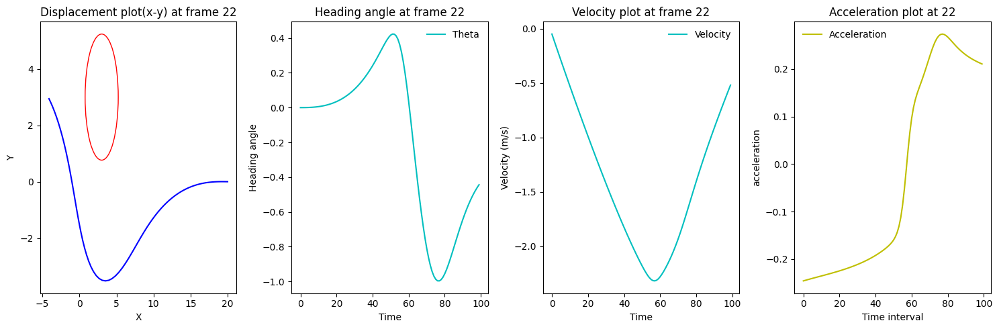

[24] loss: 1.694


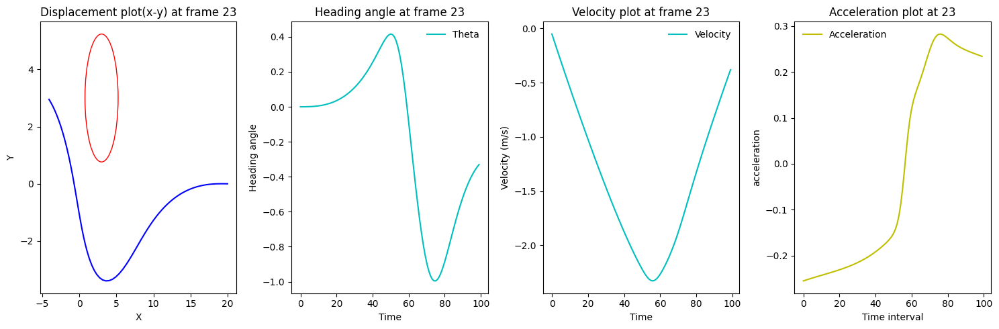

[25] loss: 1.903


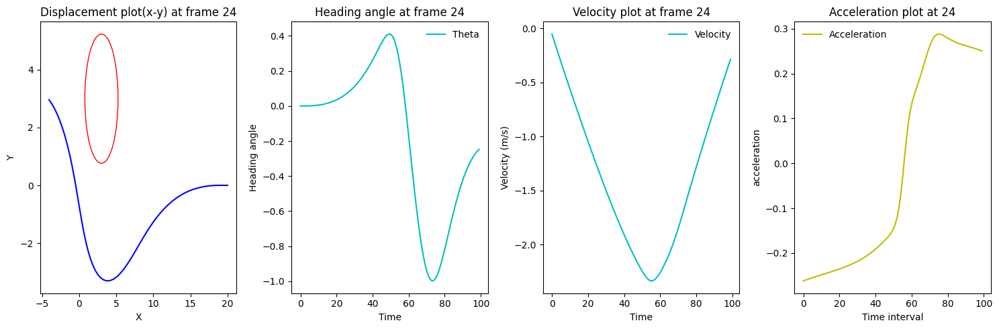

[26] loss: 2.067


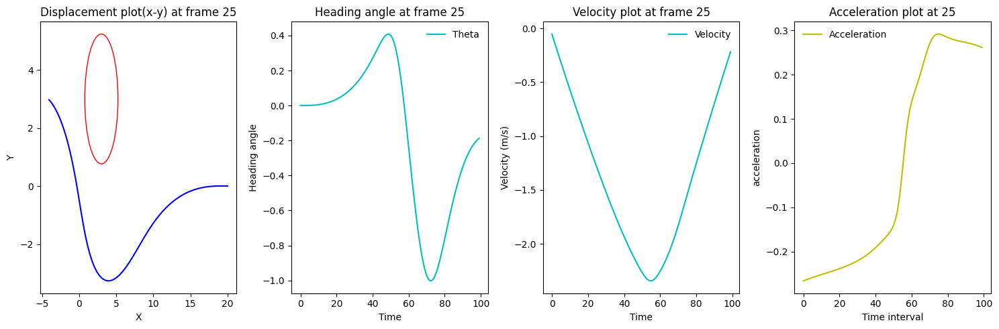

[27] loss: 2.197


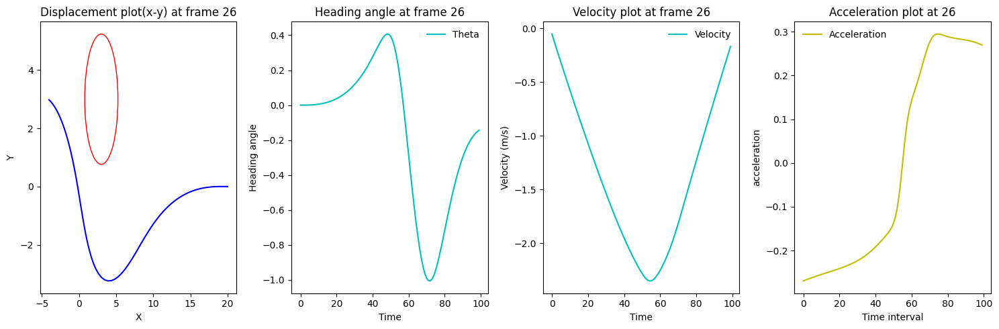

[28] loss: 2.300


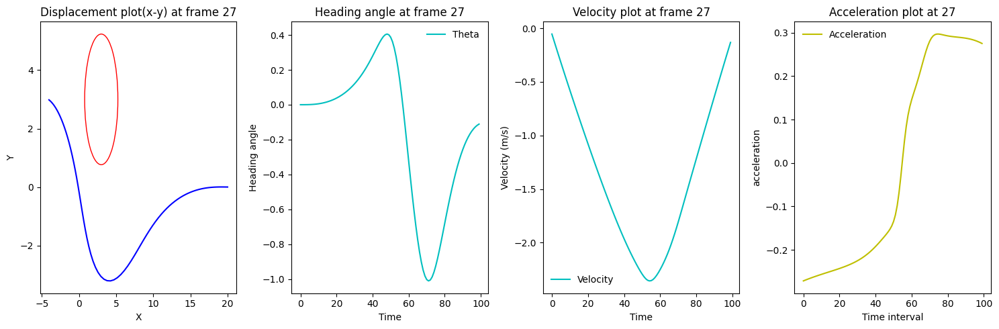

[29] loss: 2.382


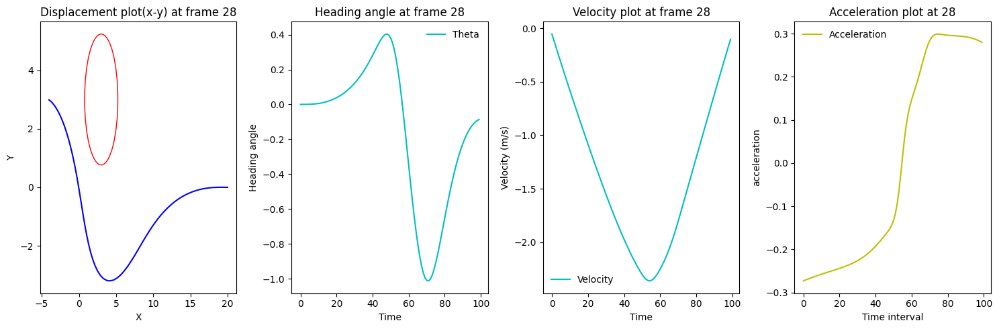

[30] loss: 2.446


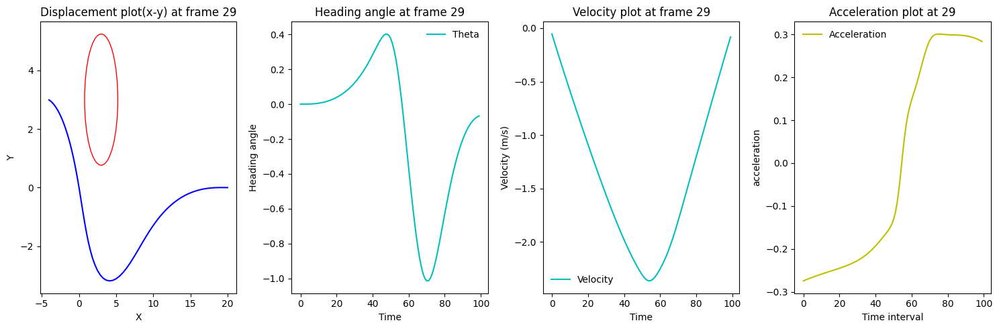

[31] loss: 2.497


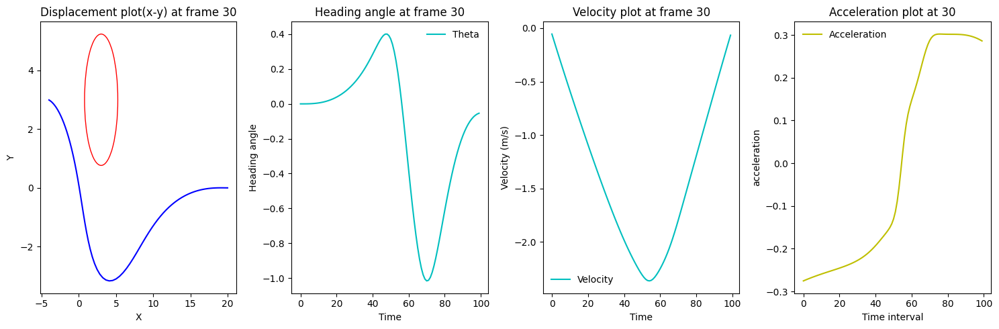

[32] loss: 2.539


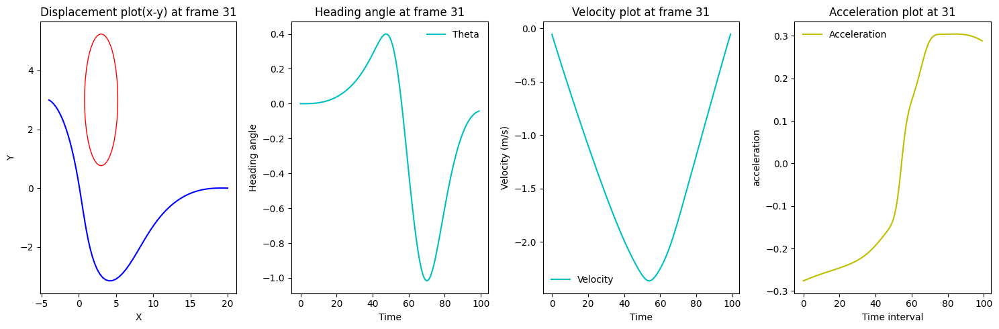

[33] loss: 2.573


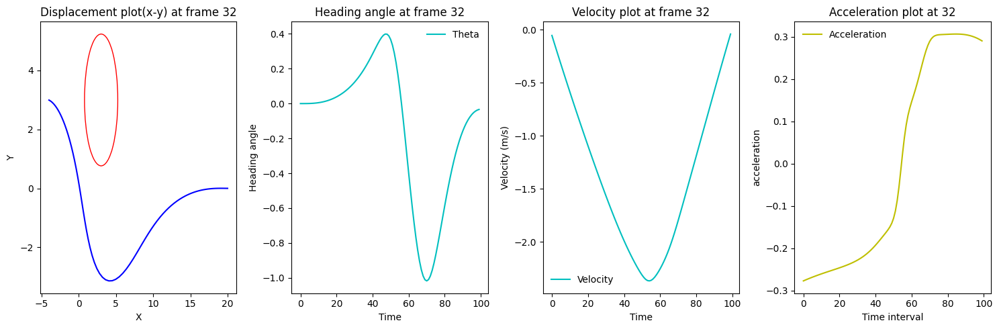

[34] loss: 2.601


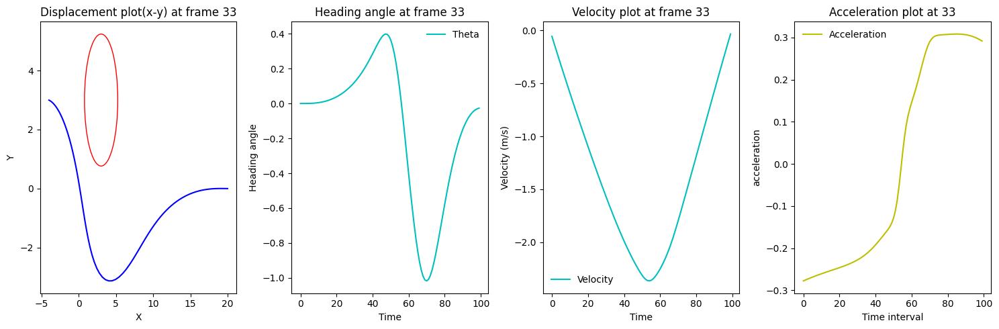

[35] loss: 2.625


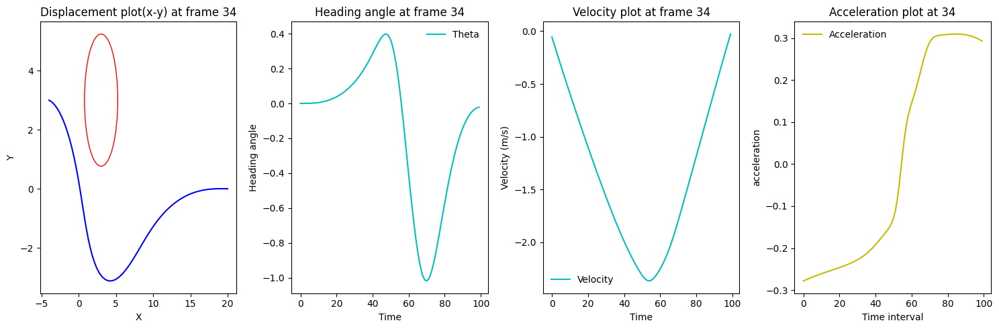

[36] loss: 2.642


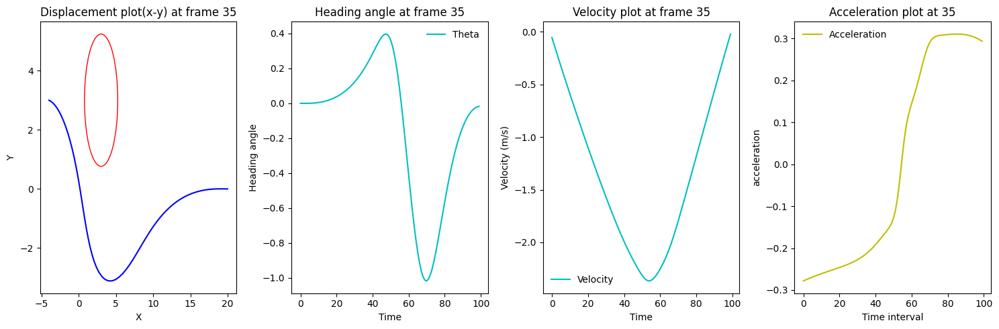

[37] loss: 2.657


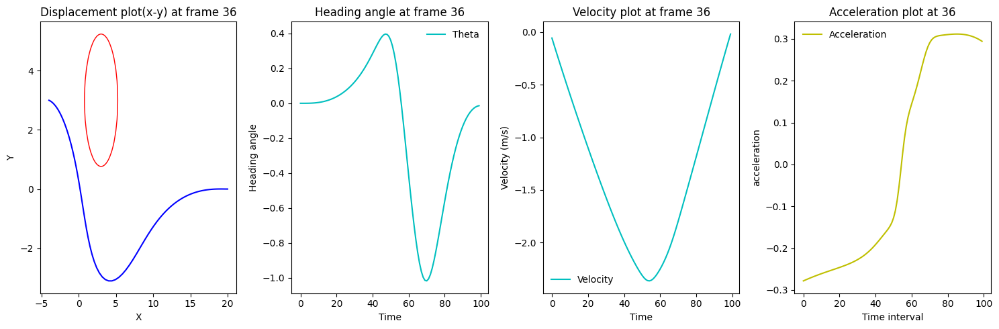

[38] loss: 2.669


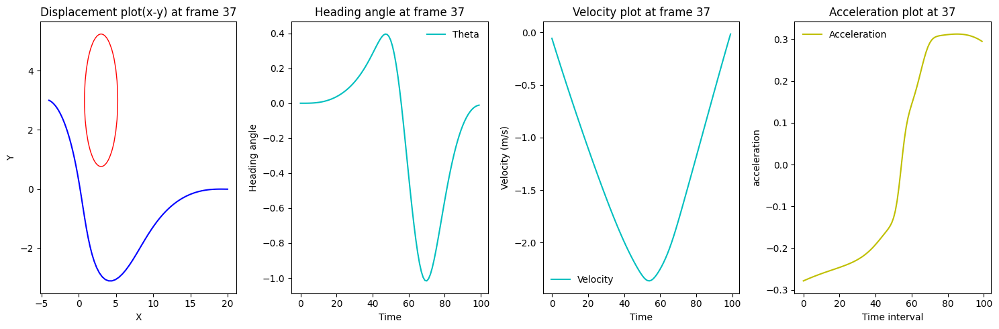

[39] loss: 2.678


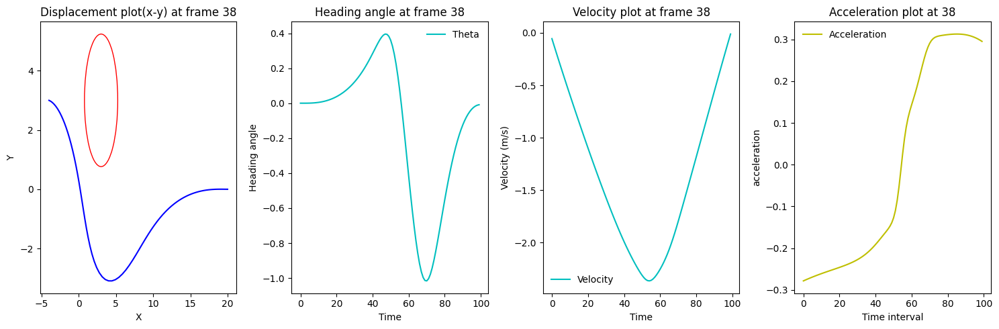

[40] loss: 2.686


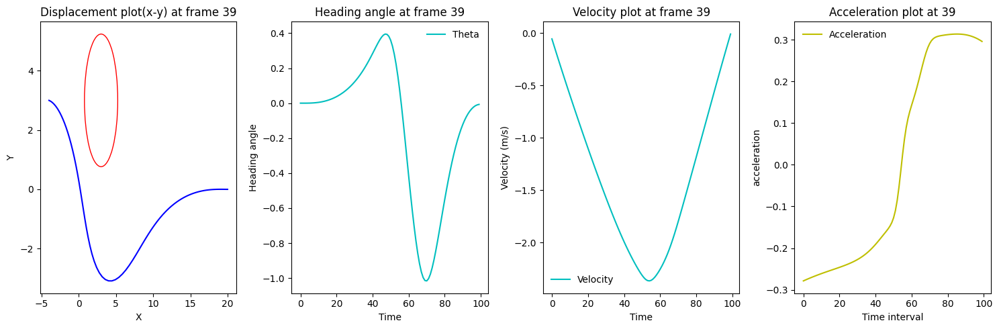

[41] loss: 2.693


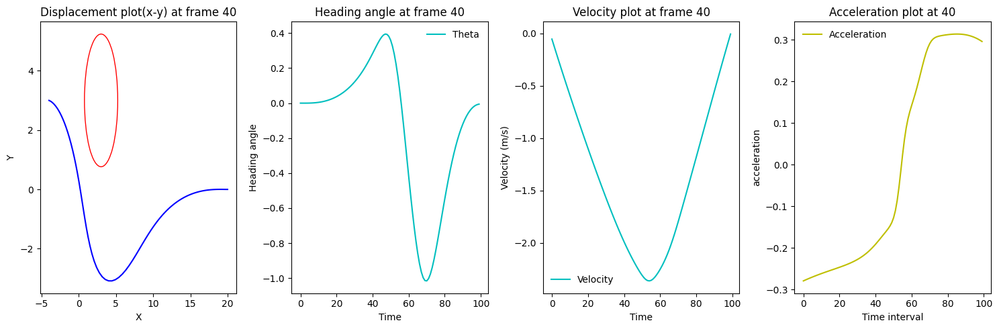

[42] loss: 2.698


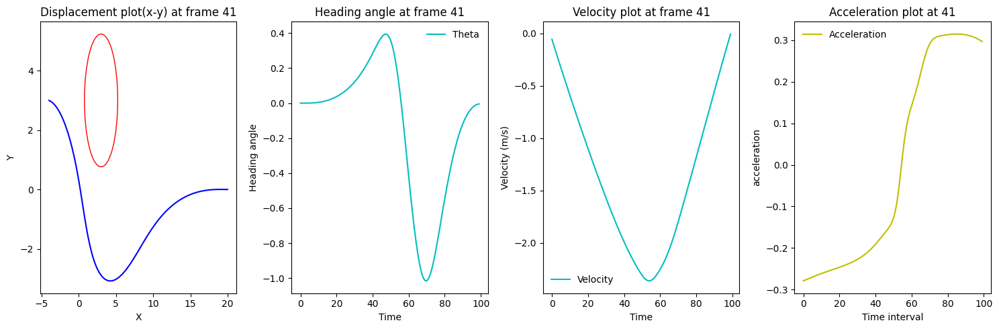

[43] loss: 2.703


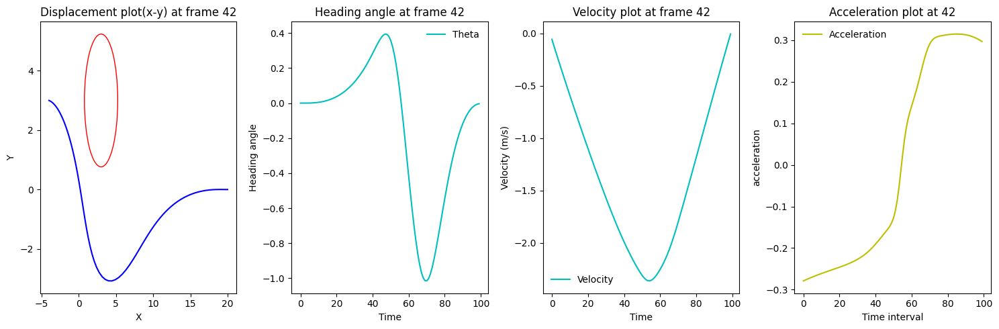

[44] loss: 2.706


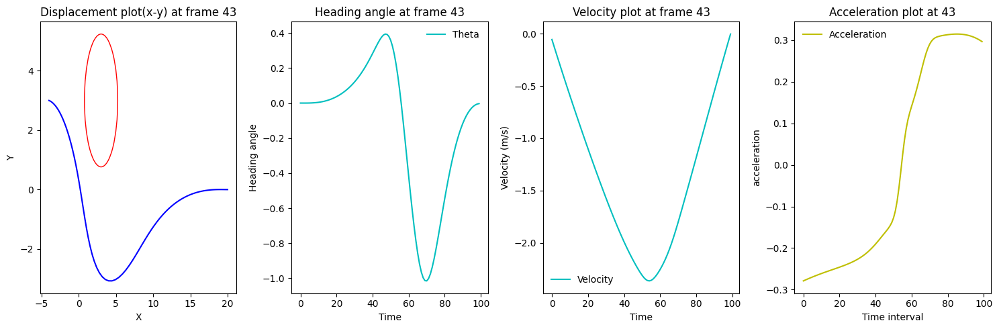

[45] loss: 2.709


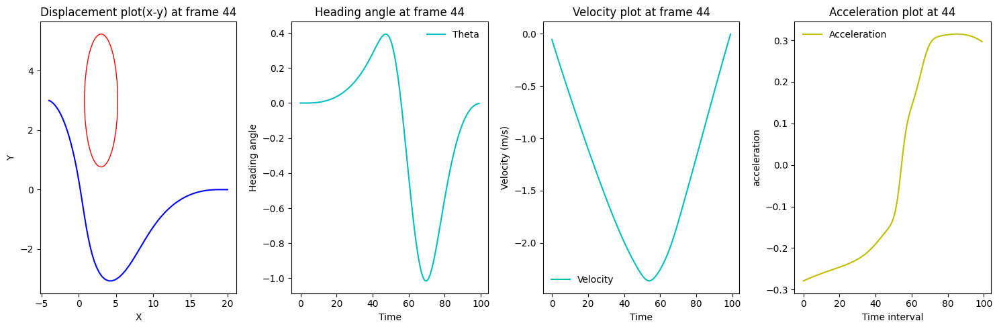

[46] loss: 2.711


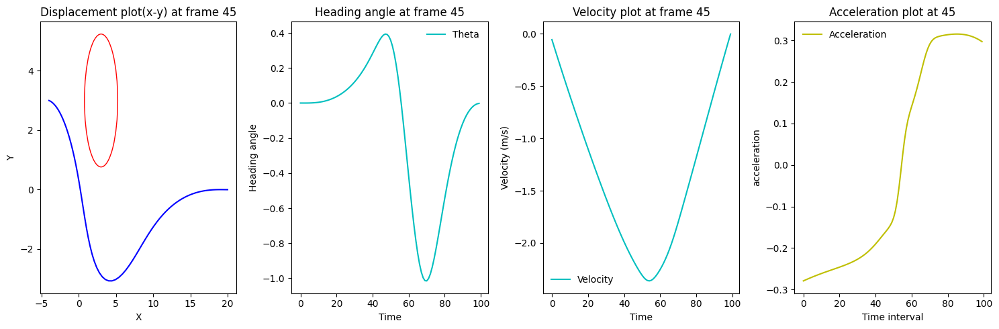

[47] loss: 2.714


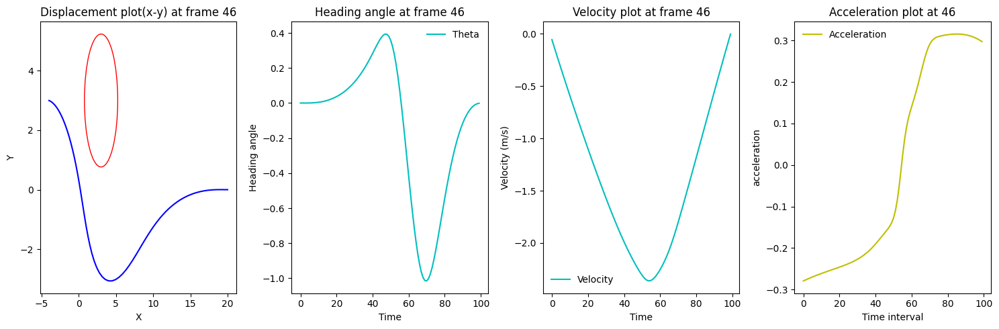

[48] loss: 2.715


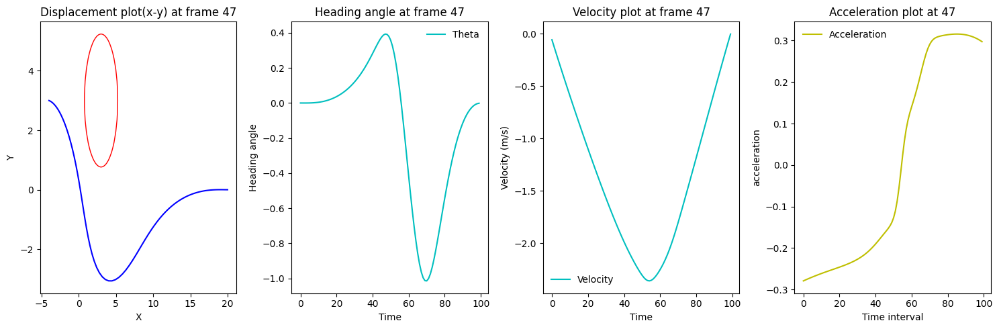

[49] loss: 2.716


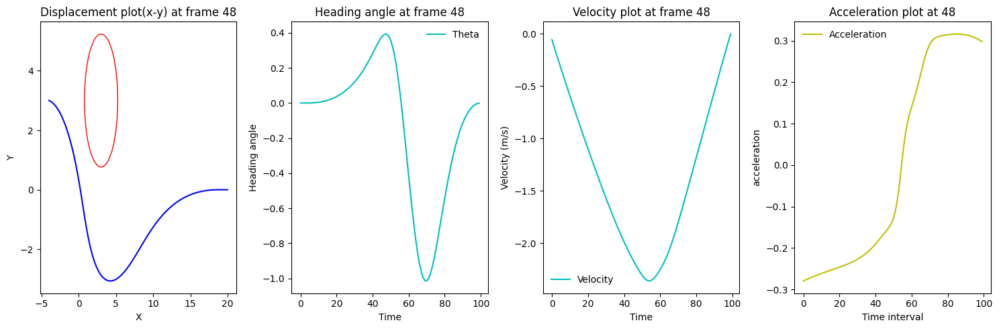

[50] loss: 2.717


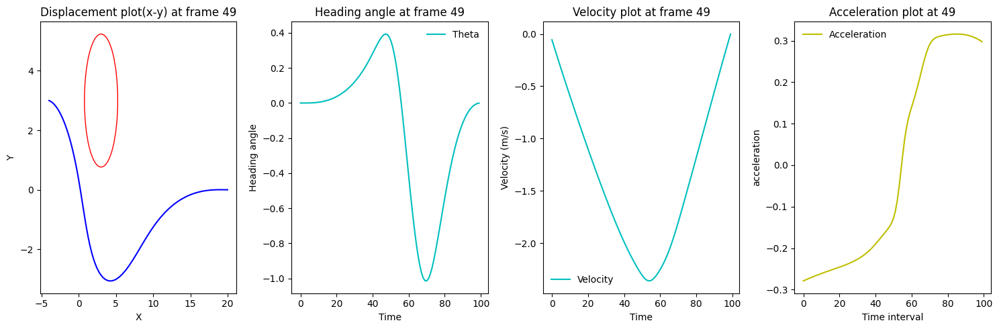

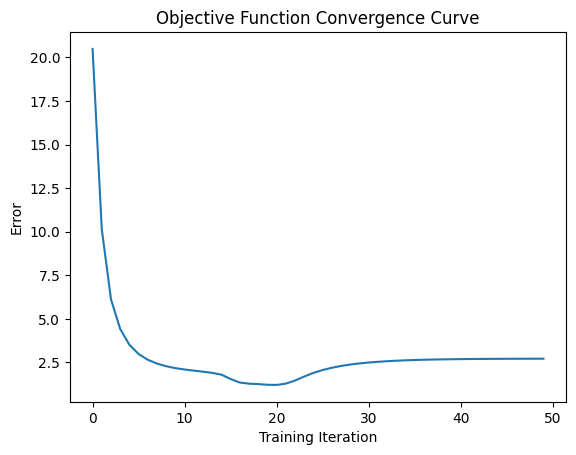

Generating Animation


IntProgress(value=0, max=101)

(100, 4) (100, 2)


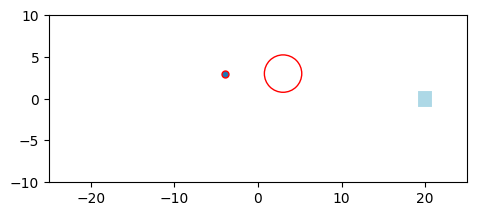

In [49]:
class Dynamics(nn.Module):

    def __init__(self):
        super(Dynamics,self).__init__()

    def forward(self,state,action):

        """
        action[0] = acceleration
        action[1] = steering angle

        state[0] = x
        state[1] = y
        state[2] = theta
        state[3] = velocity

        """
        a1=action[0,1]
        beta=torch.atan(0.5*torch.tan(a1))
        state_tensor = torch.zeros((1, 4))
        state_tensor[0, 0] = torch.cos(state[0, 2])
        state_tensor[0, 1] = torch.sin(state[0, 2])
        state_tensor[0, 2] = torch.tan(a1)

        state_theta = torch.zeros((1, 4))
        state_theta[0, 0] = torch.sin(state[0, 2])
        state_theta[0, 1] = torch.cos(state[0, 2])
        cos_beta=torch.cos(beta)
        cos_tensor = torch.mul(torch.tensor([1.,1.,1.,0.]),cos_beta.reshape(-1,1))
        sin_beta=torch.sin(beta)
        sin_tensor = torch.mul(torch.tensor([1.,1.,0.,0.]),sin_beta.reshape(-1,1))

        velocity_mat = torch.mul(torch.tensor([1.,1.,1.,0.]),state[0,3].reshape(-1,1))
        angle_tensor = torch.mul(cos_tensor,state_tensor) + torch.mul(sin_tensor,state_theta)
        inter_mat = torch.mul(velocity_mat,angle_tensor)
        accel_tensor =torch.mul(torch.tensor([0., 0., 0., 1.]),action[0, 0].reshape(-1, 1))
        final_state = frame_time*(inter_mat+accel_tensor)
        state = state + final_state

        return state

class Controller(nn.Module):
    def __init__(self,dim_input,dim_hidden,dim_output):
        """
        dim_input = No. of state (4)
        dim_output = No. of actions (2)
        dim_hidden = User choice

        """
        super(Controller,self).__init__()

        self.network = nn.Sequential(
            nn.Linear(dim_input,dim_hidden),
            nn.Tanh(),
            nn.Linear(dim_hidden,dim_hidden),
            nn.Tanh(),
            nn.Linear(dim_hidden,dim_output),
            nn.Sigmoid())

    def forward(self,state):
            action = self.network(state)
            action = (action - torch.tensor([0.5, 0.5]))*2
            #print (action)
            return action

class Simulation(nn.Module):
    def __init__(self,controller,dynamics,T):
        super(Simulation,self).__init__()
        self.state=self.initialize_state()
        self.controller=controller
        self.dynamics=dynamics
        self.T=T
        self.theta_trajectory=torch.empty((1,0))
        self.u_trajectory=torch.empty((1,0))

    def forward(self,state):
        self.action_trajectory=[]
        self.state_trajectory=[]
        k=torch.tensor(0)
        for i in range (self.T):
            action = self.controller(state)
            state=self.dynamics(state,action)
            self.action_trajectory.append(action)
            self.state_trajectory.append(state)
        return self.error(state)

    @staticmethod
    def initialize_state():
        state=[[20.,0.,0.,0.]]

        return torch.tensor(state,requires_grad=False).float()

    def error(self,state):
      x1=torch.tensor([tensor[:,0] for tensor in self.state_trajectory])
      y1=torch.tensor([tensor[:,1] for tensor in self.state_trajectory])
      return torch.mean((state-torch.tensor([[-4.,3.,0.,0.]]))**2) + torch.tensor(100)*torch.mean(torch.exp(torch.tensor(2.236068)-torch.sqrt((torch.tensor(3)-x1)**2+(torch.tensor(3)-y1)**2)))
      # + torch.tensor(10)*(torch.abs(torch.minimum(torch.tensor(0),torch.min((x1-3)**2+(y1-3)**2 - 5))))
class Optimize:

    def __init__(self,simulation):
        self.simulation=simulation
        self.parameters=simulation.controller.parameters()
        self.optimizer = optim.LBFGS(self.parameters,lr=0.01)
        self.loss_list=[]

    def step(self):
        def closure():
            loss = self.simulation(self.simulation.state)
            self.optimizer.zero_grad()
            loss.backward()
            return loss

        self.optimizer.step(closure)
        return closure()

    def train(self,epochs):
        l=np.zeros(epochs)
        for epoch in range(epochs):
            self.epoch = epoch
            loss=self.step()
            self.loss_list.append(loss)
            print('[%d] loss: %.3f' % (epoch + 1, loss))
            l[epoch]=loss
            self.visualize()


        plt.plot(list(range(epochs)), l)
        plt.title('Objective Function Convergence Curve')
        plt.xlabel('Training Iteration')
        plt.ylabel('Error')
        plt.show()
        #print(self.simulation.state_trajectory)

        self.animation(epochs)


    def visualize(self):
        data = np.array([self.simulation.state_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])
        x = data[:, 0]
        y = data[:, 1]
        theta = data[:, 2]
        v = data[:, 3]
        action_data = np.array([self.simulation.action_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])
        acc = action_data[:,0]
        ster_ang=action_data[:,1]
        frame = range(self.simulation.T)

        fig, ax = plt.subplots(1,4, tight_layout = 1,figsize = (15,5))

        ax[0].plot(x, y, c = 'b')
        ax[0].set_xlabel("X")
        ax[0].set_ylabel("Y")
        ax[0].set(title=f'Displacement plot(x-y) at frame {self.epoch}')
        circle = patches.Circle((3, 3), radius=2.236, edgecolor='r', facecolor='none')
        ax[0].add_patch(circle)


        ax[1].plot(frame, theta, c = 'c', label = "Theta")
        ax[1].set_xlabel("Time")
        ax[1].set_ylabel("Heading angle")
        ax[1].legend(frameon=0)
        ax[1].set(title =f'Heading angle at frame {self.epoch}')

        ax[2].plot(frame, v, c = 'c', label = "Velocity")
        ax[2].set_xlabel("Time")
        ax[2].set_ylabel("Velocity (m/s)")
        ax[2].legend(frameon=0)
        ax[2].set(title =f'Velocity plot at frame {self.epoch}')

        ax[3].plot(frame, acc, c = 'y', label = "Acceleration")
        ax[3].set_xlabel("Time interval")
        ax[3].set_ylabel("acceleration")
        ax[3].legend(frameon=0)
        ax[3].set(title=f'Acceleration plot at {self.epoch}')
        plt.show()

    def animation(self, epochs):
              # Size
        length = 0.10          # m
        width = 0.02          # m

        #
        #v_exhaust = 1
        print("Generating Animation")
        steps = self.simulation.T + 1
        final_time_step = round(1/steps,2)
        f = IntProgress(min = 0, max = steps)
        display(f)

        data = np.array([self.simulation.state_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])
        action_data = np.array([self.simulation.action_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])

        x_t = data
        u_t = action_data
        print(x_t.shape, u_t.shape)

        fig = plt.figure(figsize = (5,8), constrained_layout=False)
        ax1 = fig.add_subplot(111)
        #plt.axhline(y=0., color='b', linestyle='--', lw=0.8)

        ln1, = ax1.plot([], [], linewidth = 10, color = 'lightblue') # rocket body
        ln6, = ax1.plot([], [], '--', linewidth = 2, color = 'orange') # trajectory line
        #ln2, = ax1.plot([], [], linewidth = 4, color = 'tomato') # thrust line

        plt.tight_layout()

        ax1.set_xlim(-25, 25)
        ax1.set_ylim(-10, 10)
        ax1.set_aspect(1)  # aspect of the axis scaling, i.e. the ratio of y-unit to x-unit
        circle = patches.Circle((3, 3), radius=2.236, edgecolor='r', facecolor='none')
        ax1.add_patch(circle)
        ax1.plot(-4,3,marker="o", markersize=5,markeredgecolor="red")

        def update(i):
            rocket_theta = x_t[i, 2]

            rocket_x = x_t[i, 0]
            # length/1 is just to make rocket bigger in animation
            rocket_x_points = [rocket_x + length/1 * np.sin(rocket_theta), rocket_x - length/1 * np.sin(rocket_theta)]

            rocket_y = x_t[i, 1]
            rocket_y_points = [rocket_y + length/1 * np.cos(rocket_theta), rocket_y - length/1 * np.cos(rocket_theta)]

            ln1.set_data(rocket_x_points, rocket_y_points)

            thrust_mag = u_t[i, 0]
            thrust_angle = -u_t[i, 1]

            ln6.set_data(x_t[:i, 0], x_t[:i, 1])
            f.value += 1

        playback_speed = 5000 # the higher the slower
        anim = FuncAnimation(fig, update, np.arange(0, steps-1, 1), interval= final_time_step * playback_speed)

        # Save as GIF
        writer = PillowWriter(fps=20)
        anim.save("rocket_landing_with_obstacle.gif", writer=writer)


T = 100  # number of time steps of the simulation
dim_input = 4  # state space dimensions
dim_hidden = 8  # latent dimensions
dim_output = 2  # action space dimensions
d = Dynamics()
c = Controller(dim_input, dim_hidden, dim_output)
s = Simulation(c, d, T)
o = Optimize(s)
o.train(50)

In [14]:
import logging
import math
import random
import numpy as np
import time
import torch
import torch.nn as nn
from torch import optim
from torch.nn import utils
import matplotlib.pyplot as plt
from ipywidgets import IntProgress
from IPython.display import display
from matplotlib import pyplot as plt, rc
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation, PillowWriter
from jupyterthemes import jtplot

We make another copy of the code but without any obstacle, the bicycle directly goes to the final point.

[1] loss: 79.205


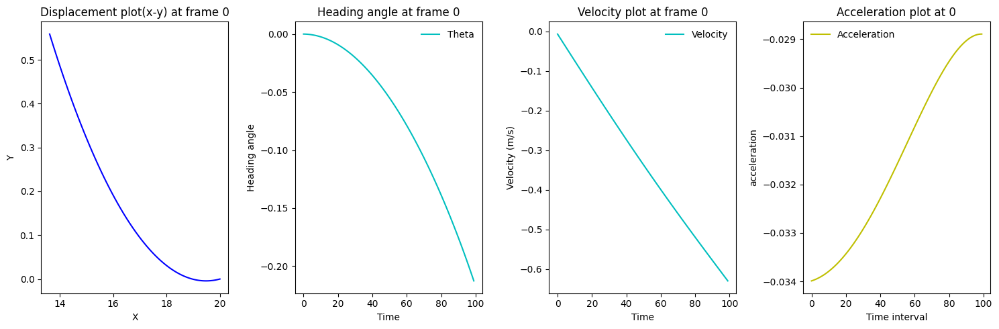

[2] loss: 42.774


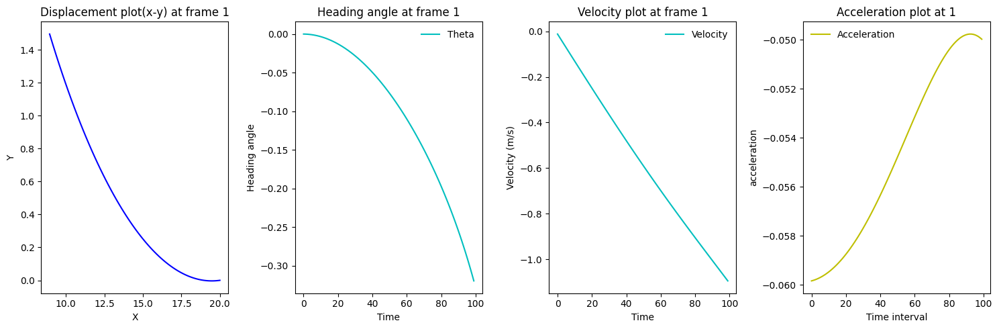

[3] loss: 24.939


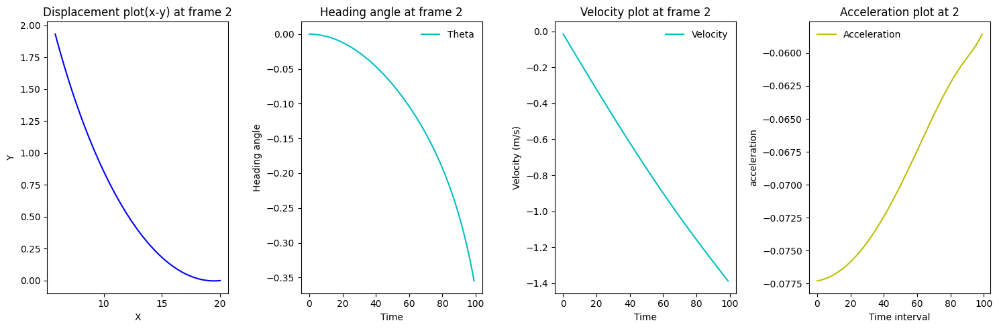

[4] loss: 15.467


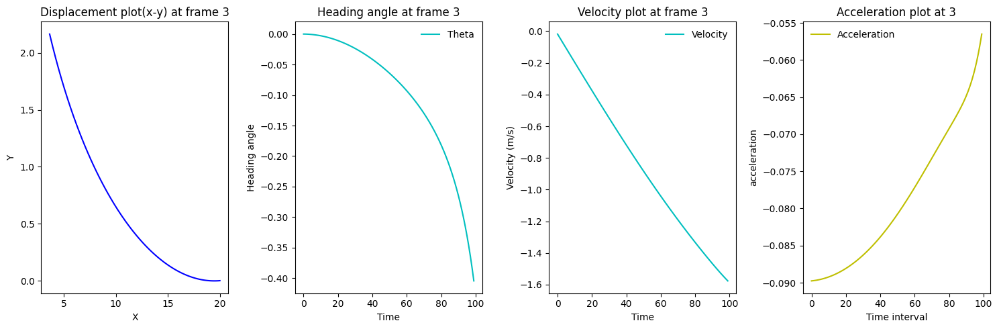

[5] loss: 10.163


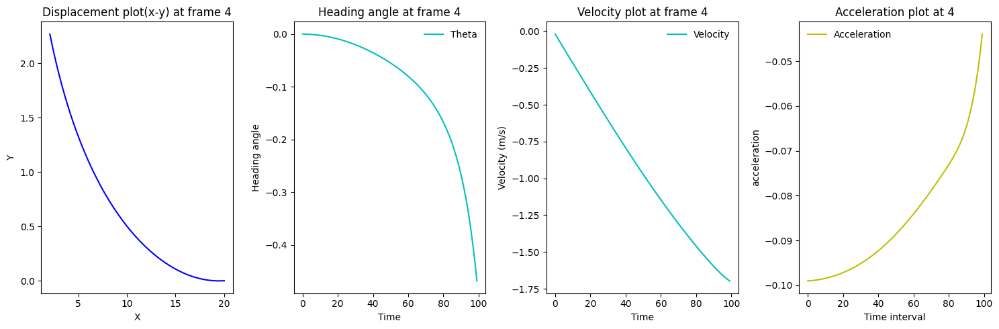

[6] loss: 6.998


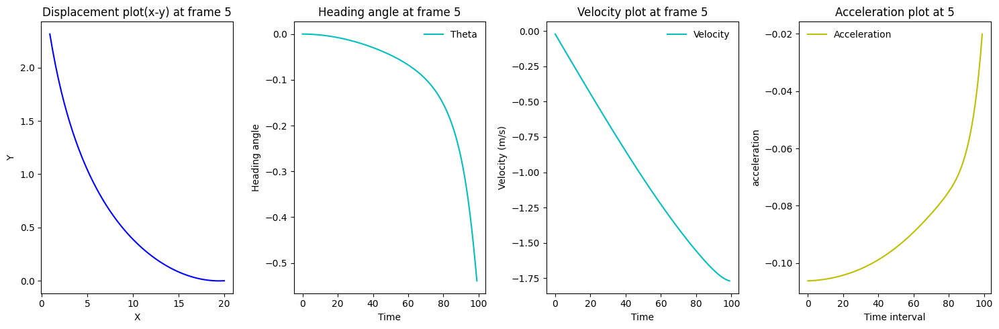

[7] loss: 4.953


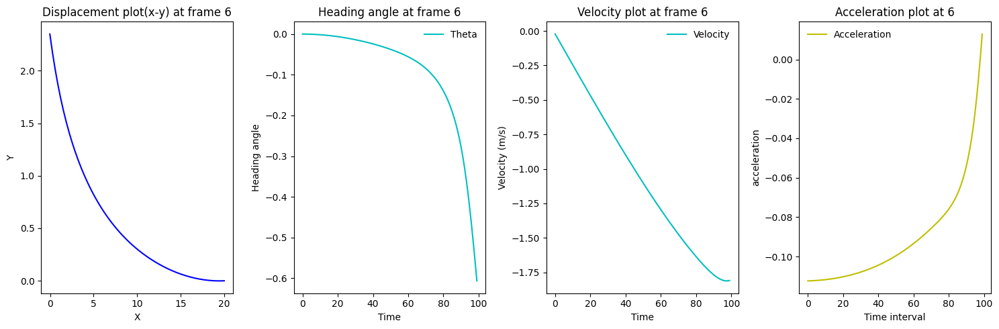

[8] loss: 3.514


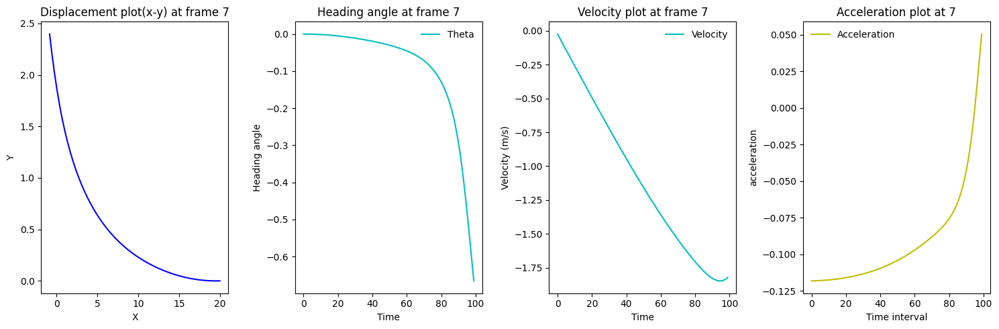

[9] loss: 2.486


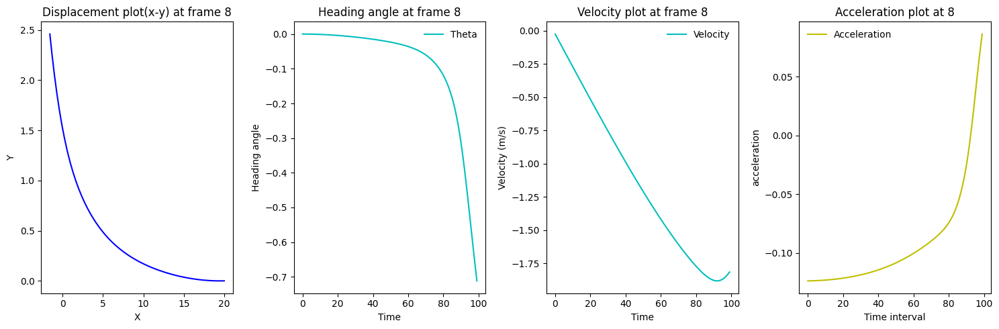

[10] loss: 1.811


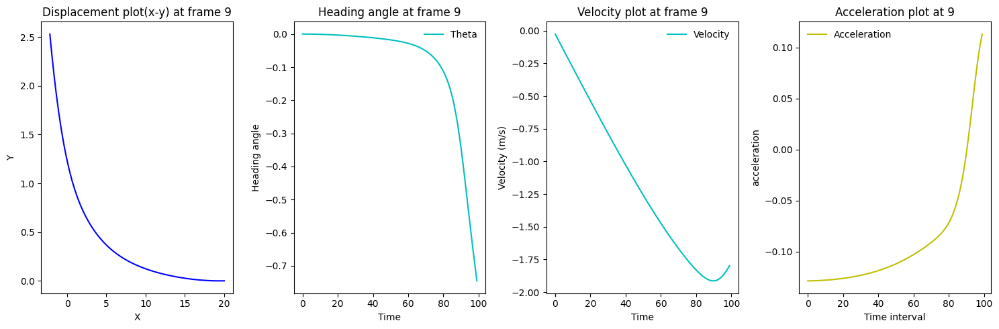

[11] loss: 1.429


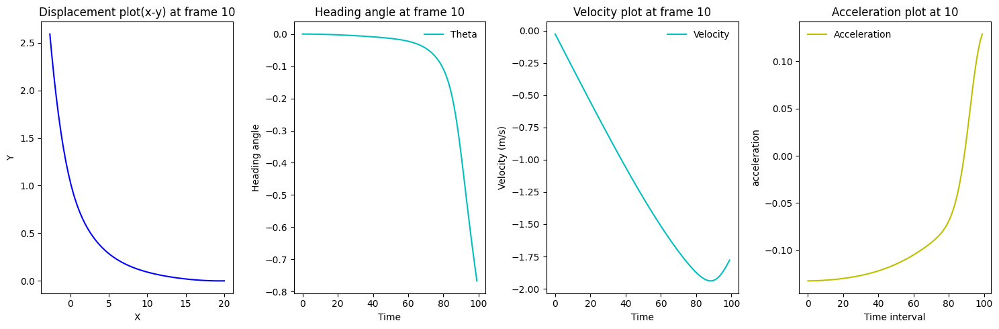

[12] loss: 1.213


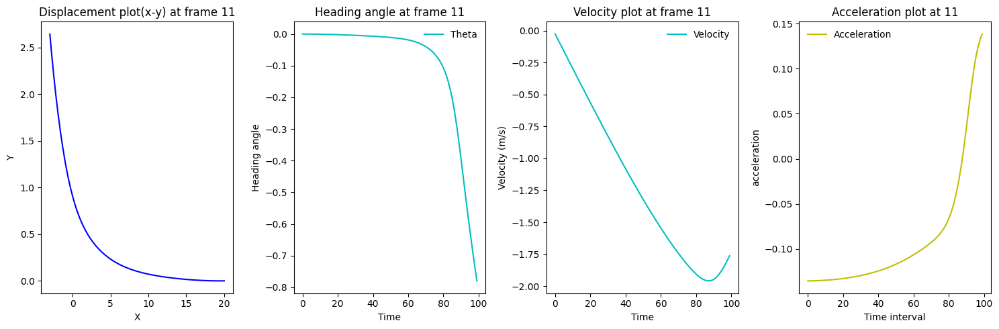

[13] loss: 1.086


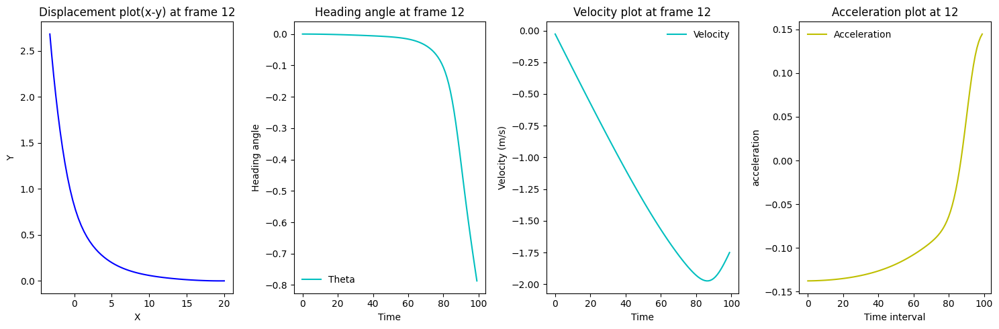

[14] loss: 1.007


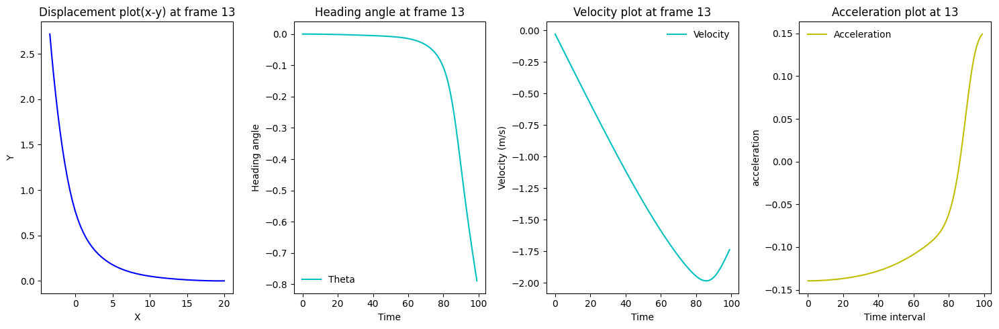

[15] loss: 0.952


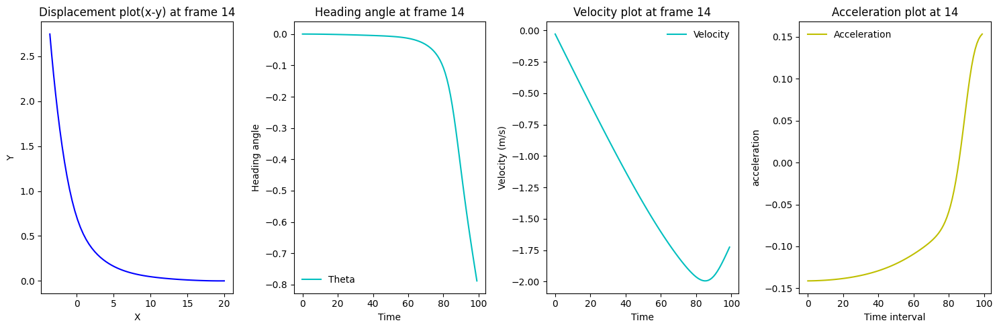

[16] loss: 0.914


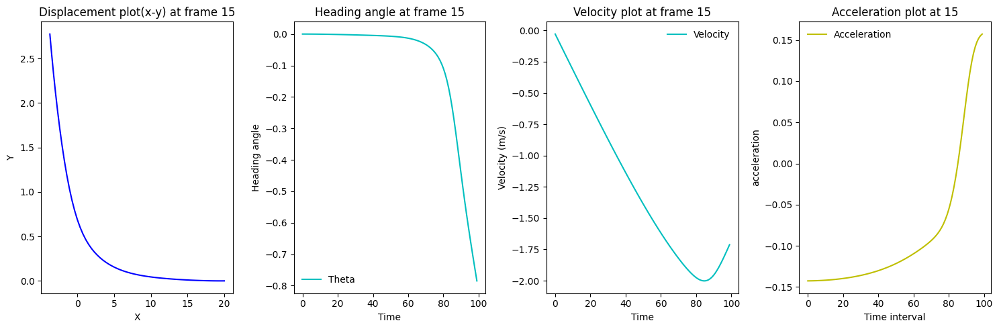

[17] loss: 0.887


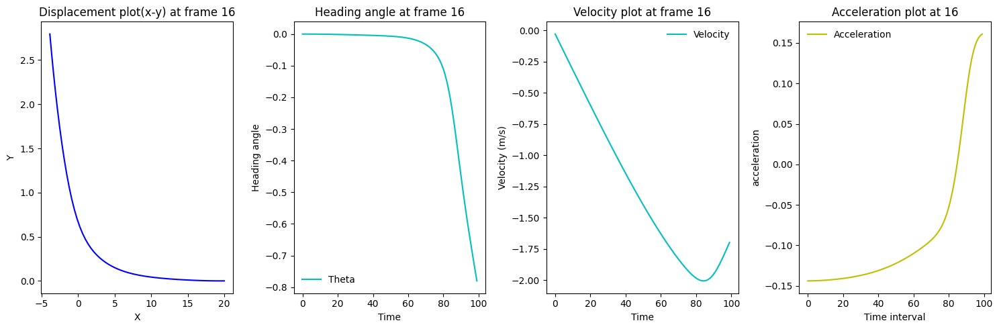

[18] loss: 0.866


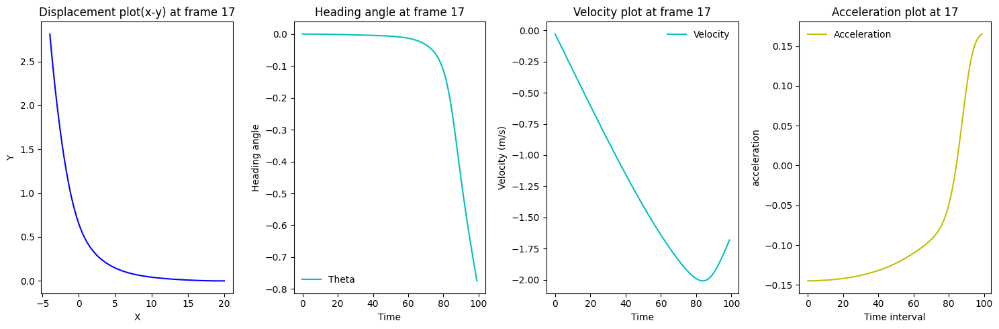

[19] loss: 0.843


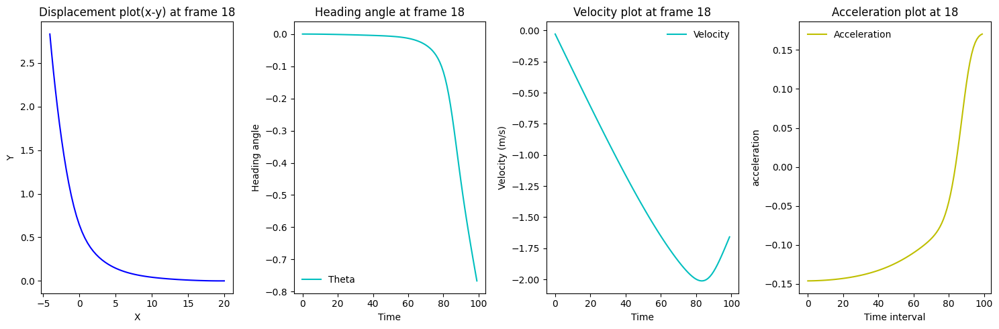

[20] loss: 0.813


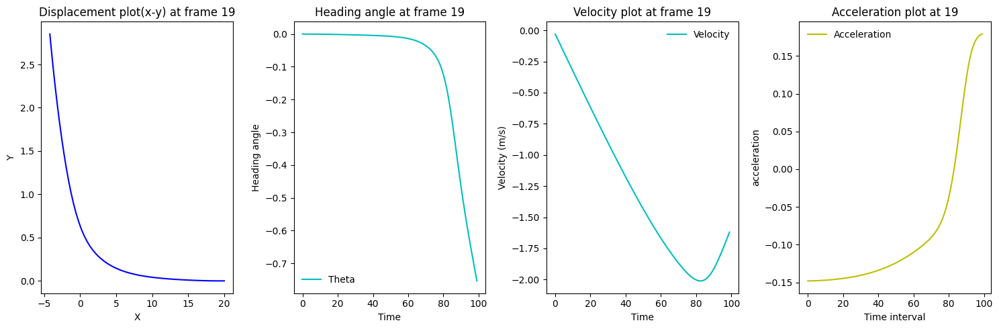

[21] loss: 0.756


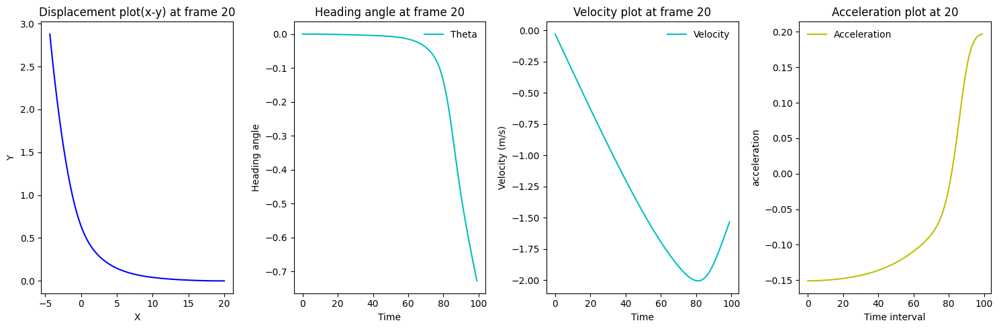

[22] loss: 0.329


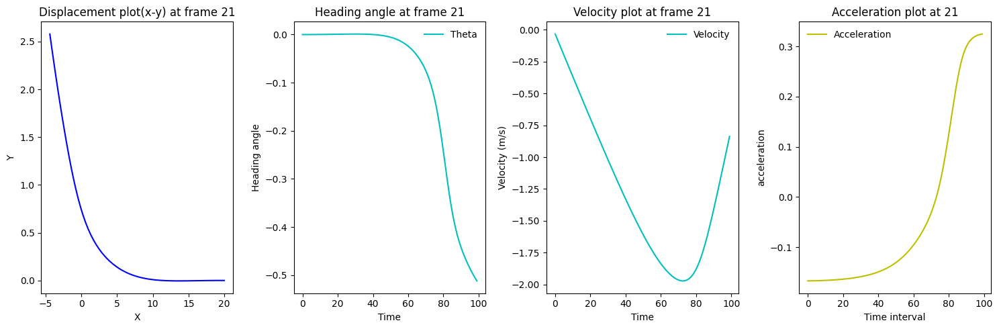

[23] loss: 0.212


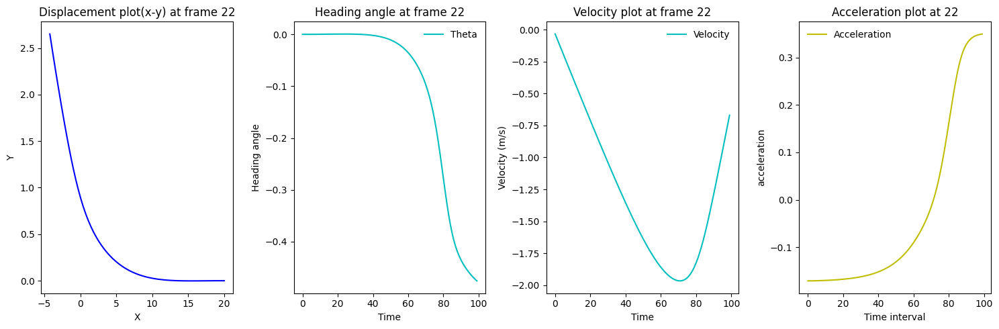

[24] loss: 0.159


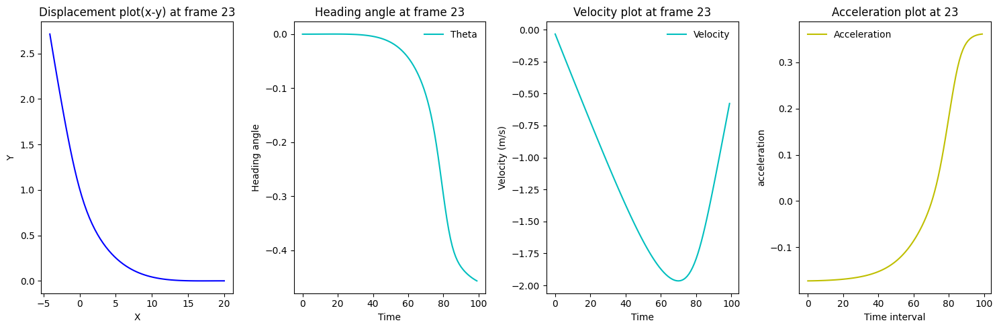

[25] loss: 0.127


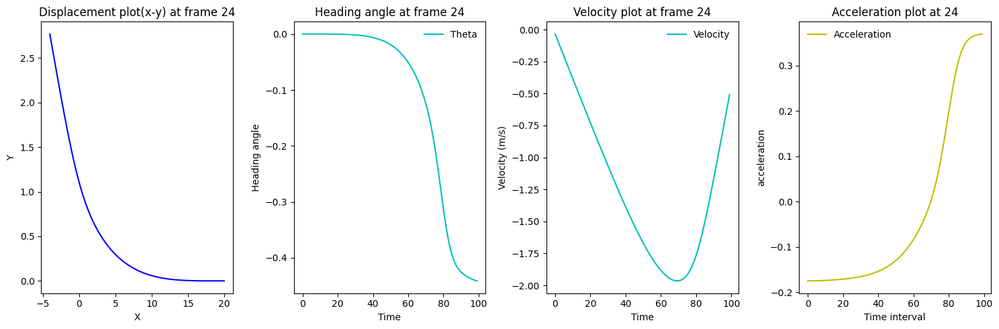

[26] loss: 0.103


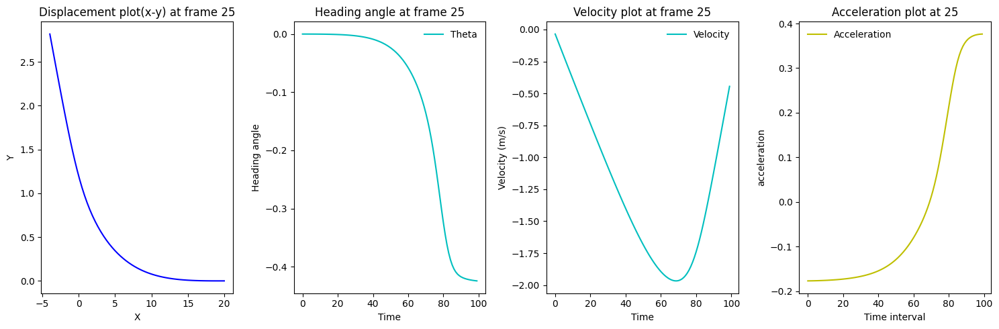

[27] loss: 0.089


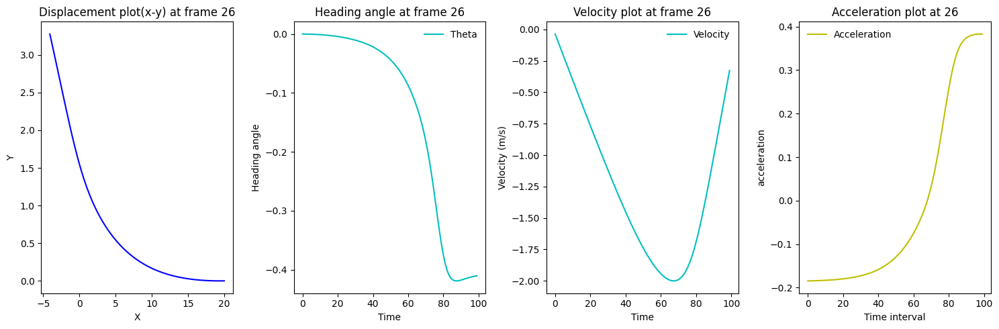

[28] loss: 0.061


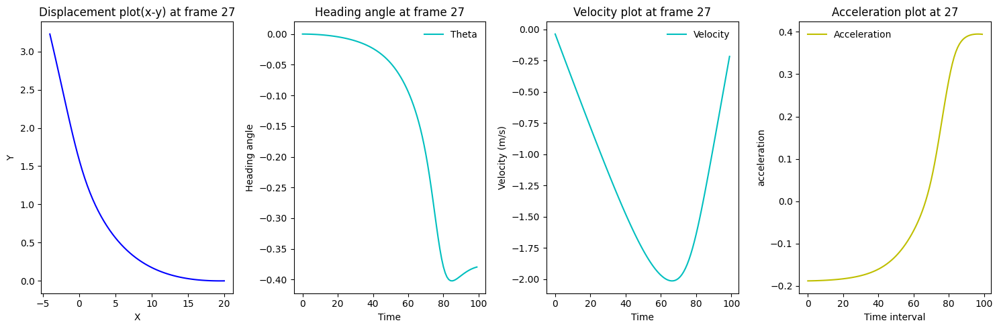

[29] loss: 0.046


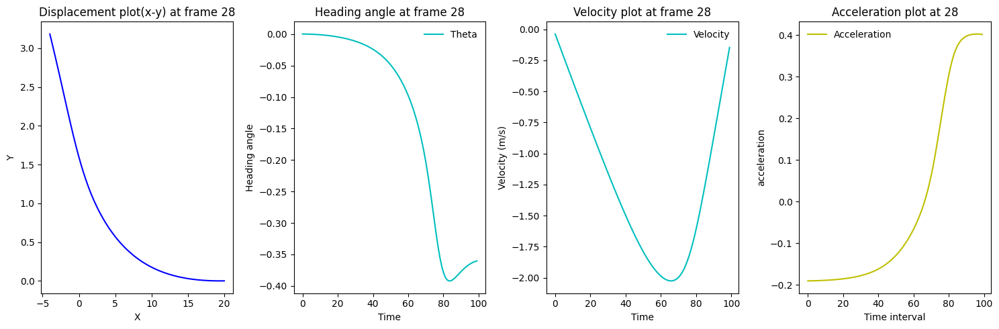

[30] loss: 0.038


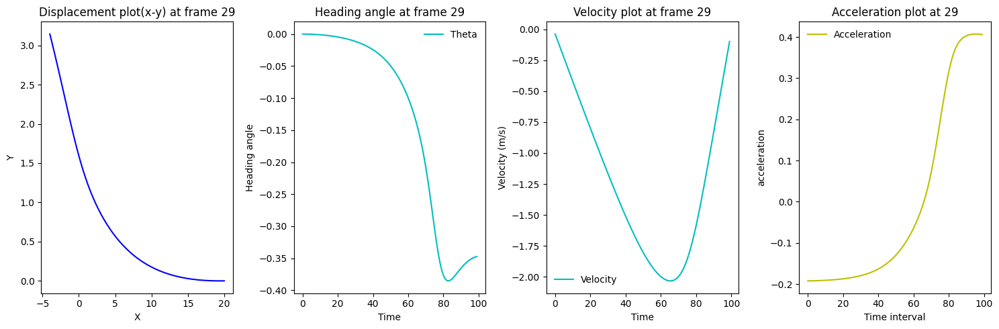

[31] loss: 0.033


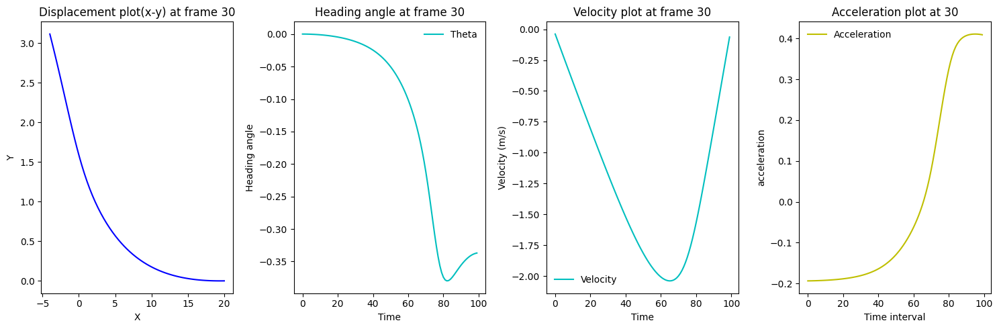

[32] loss: 0.029


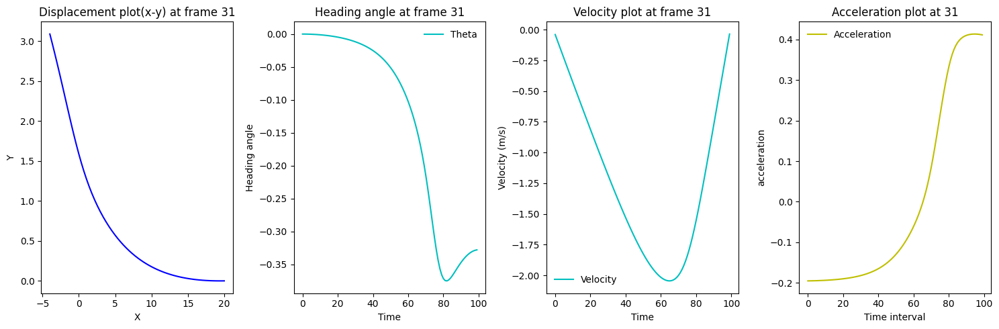

[33] loss: 0.027


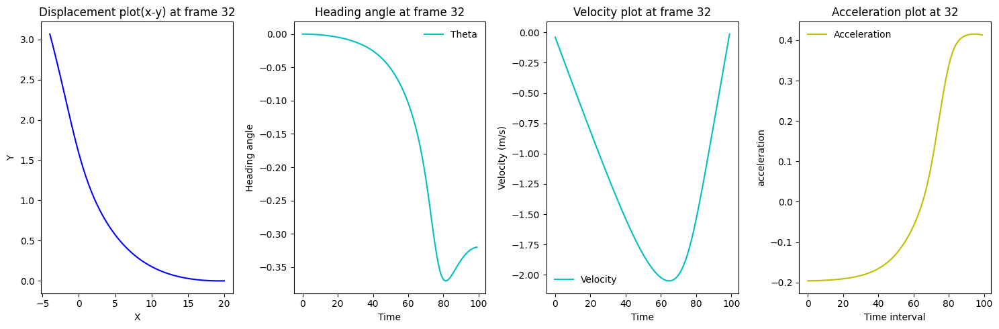

[34] loss: 0.025


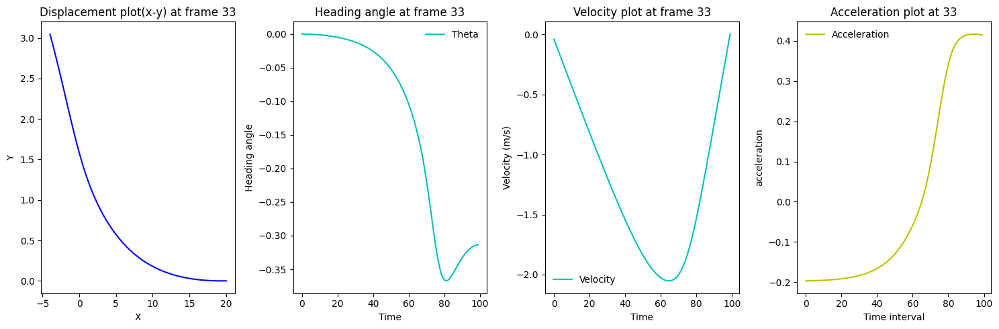

[35] loss: 0.024


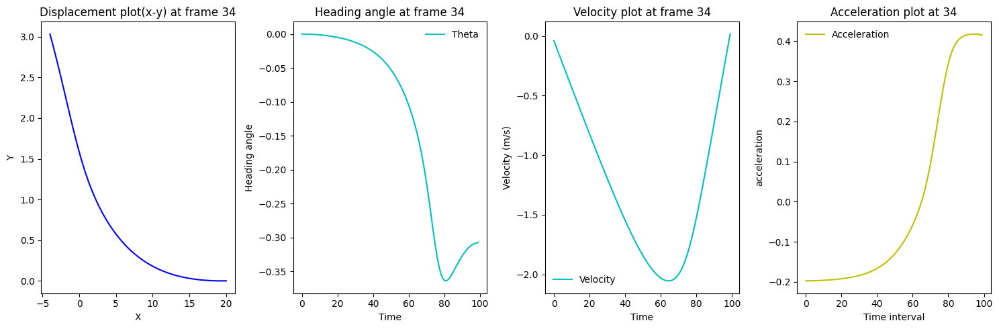

[36] loss: 0.023


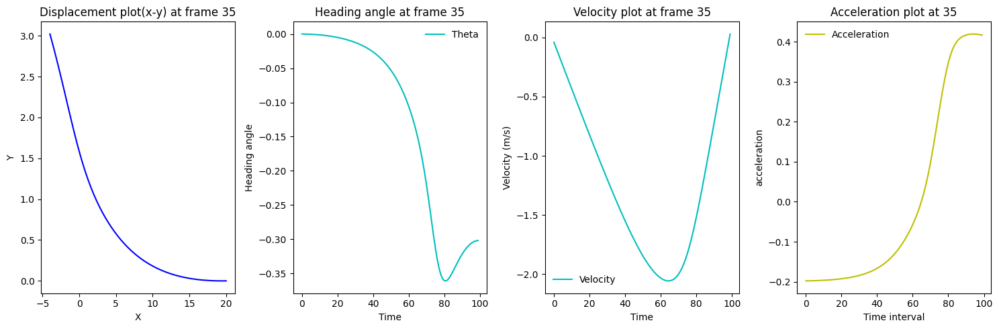

[37] loss: 0.022


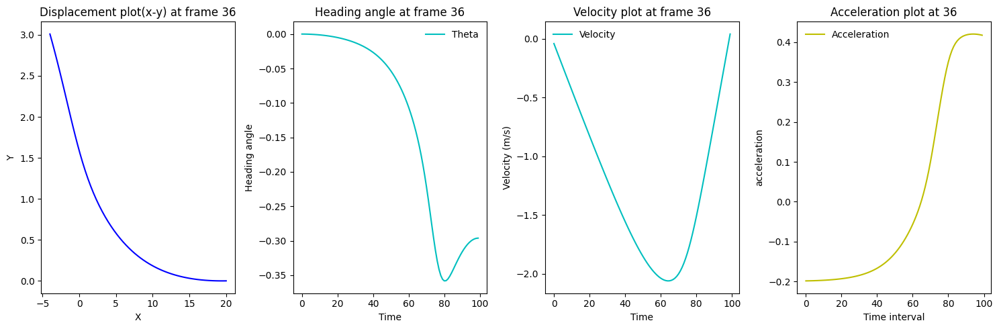

[38] loss: 0.022


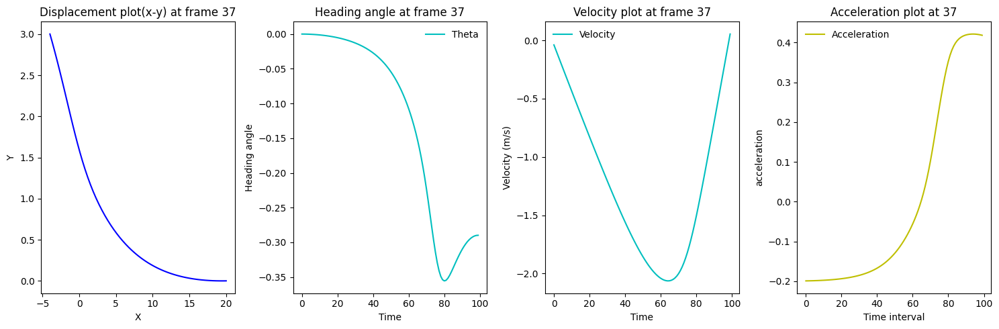

[39] loss: 0.021


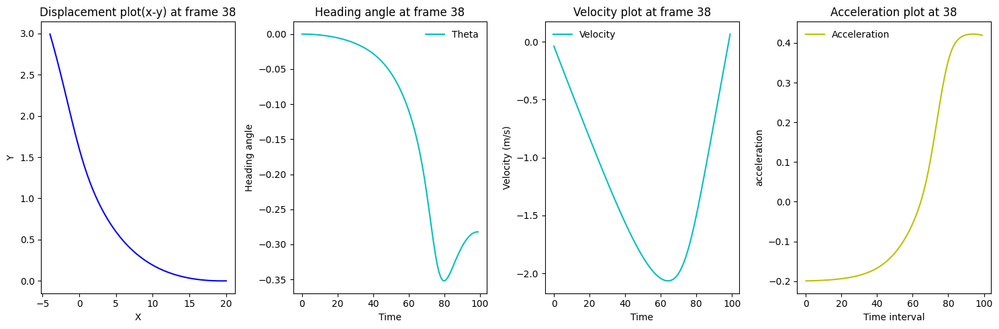

[40] loss: 0.020


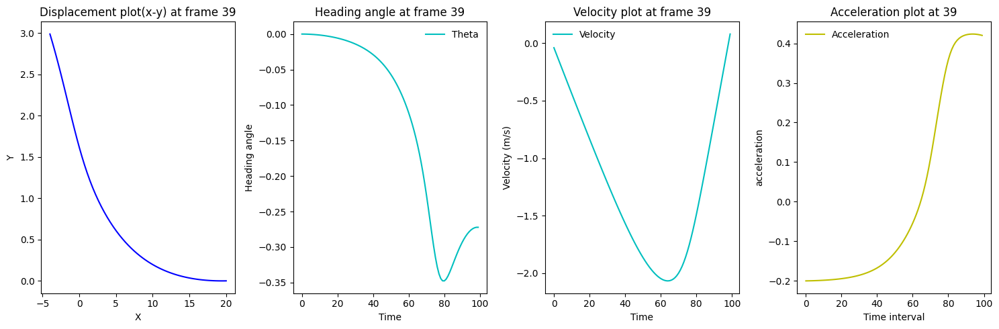

[41] loss: 0.019


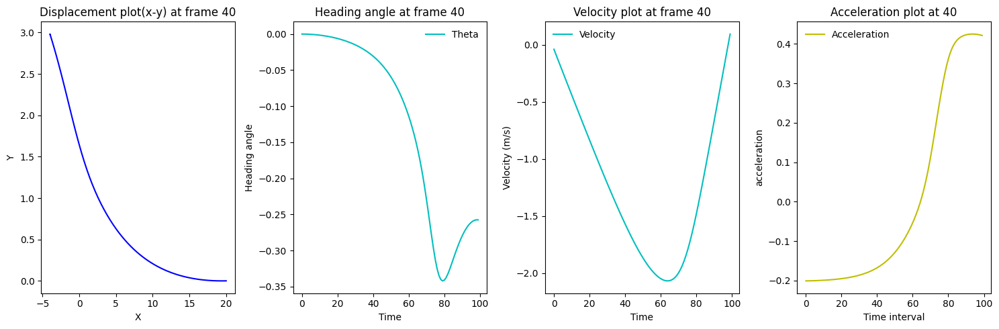

[42] loss: 0.017


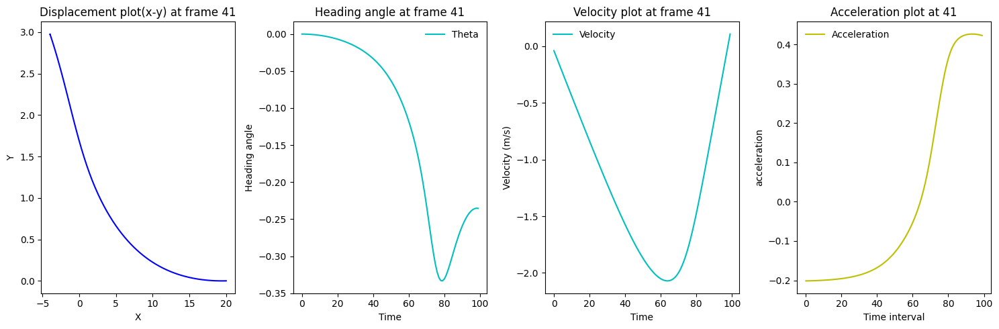

[43] loss: 0.013


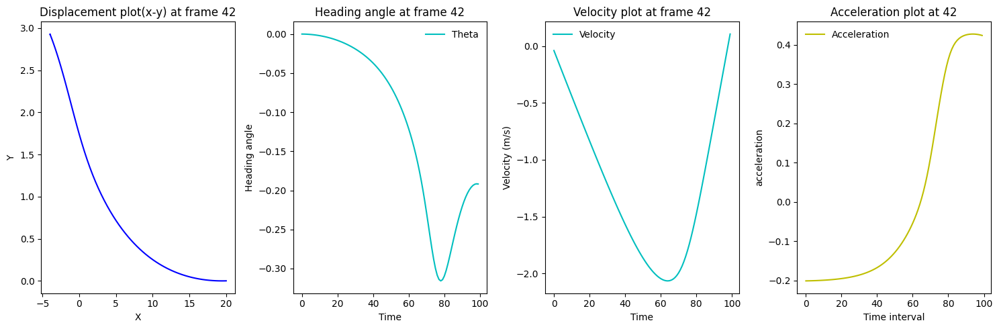

[44] loss: 0.008


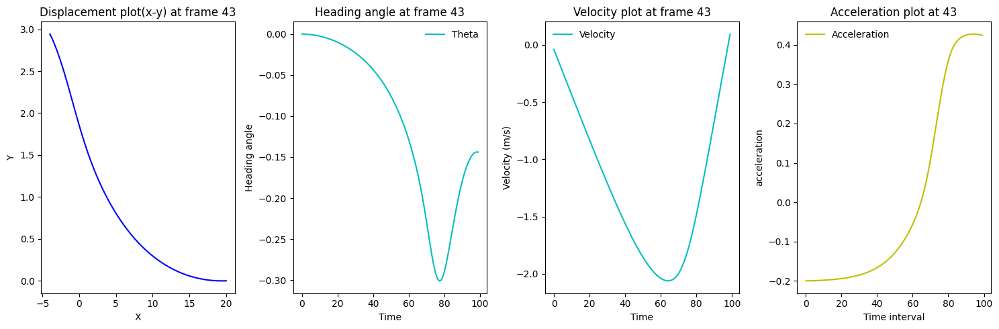

[45] loss: 0.005


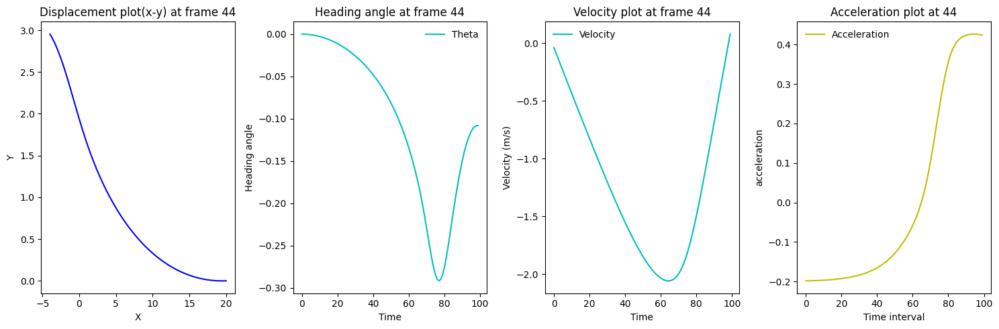

[46] loss: 0.003


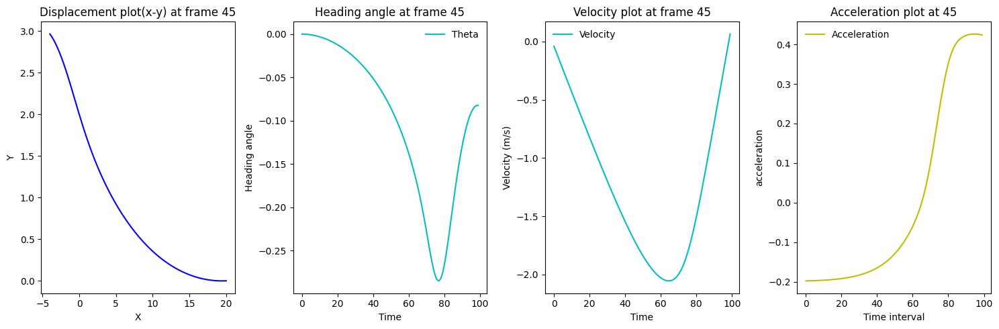

[47] loss: 0.002


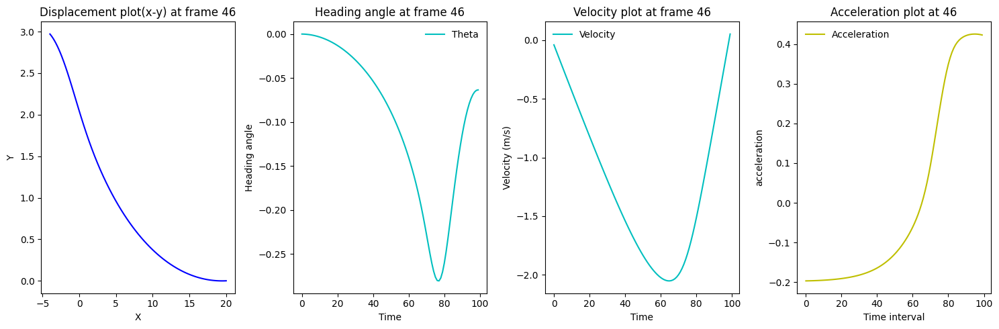

[48] loss: 0.001


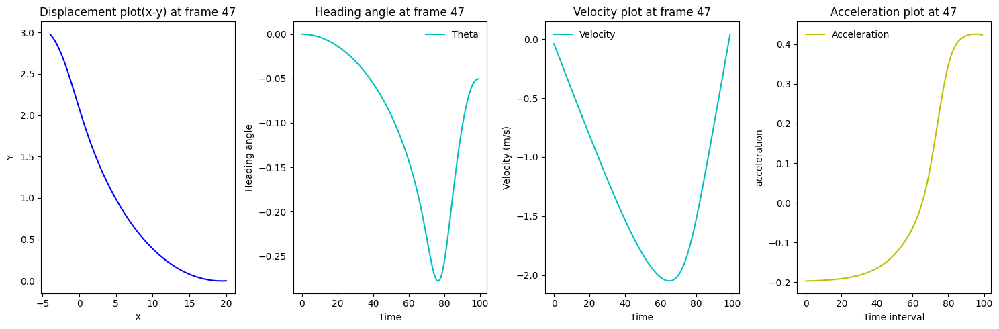

[49] loss: 0.001


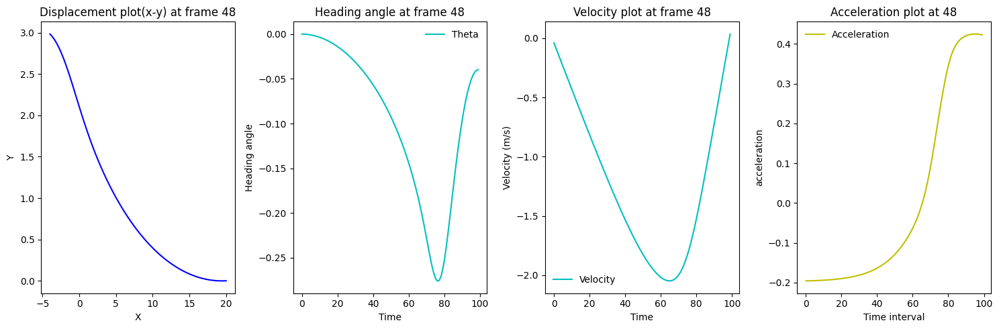

[50] loss: 0.001


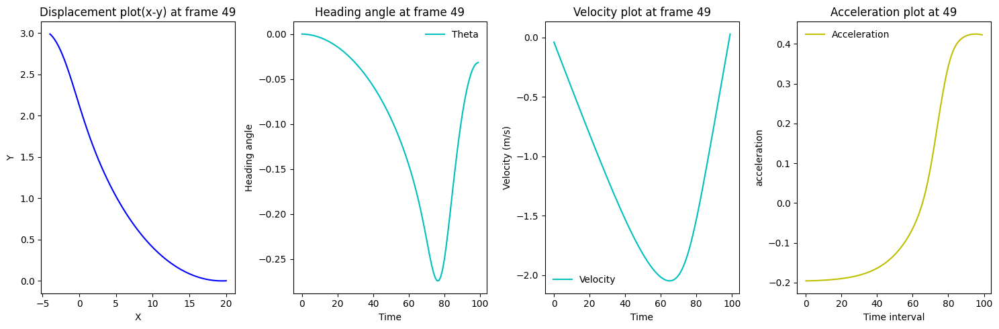

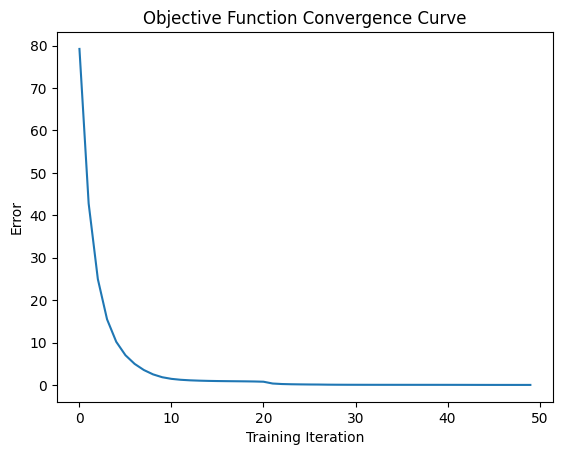

Generating Animation


IntProgress(value=0, max=101)

(100, 4) (100, 2)


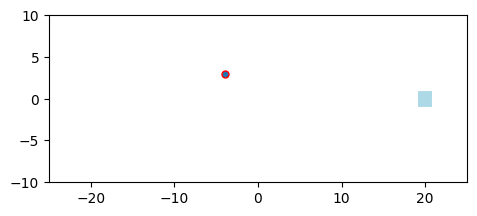

In [18]:
class Dynamics(nn.Module):

    def __init__(self):
        super(Dynamics,self).__init__()

    def forward(self,state,action):

        """
        action[0] = acceleration
        action[1] = steering angle

        state[0] = x
        state[1] = y
        state[2] = theta
        state[3] = velocity

        """
        a1=action[0,1]
        beta=torch.atan(0.5*torch.tan(a1))
        state_tensor = torch.zeros((1, 4))
        state_tensor[0, 0] = torch.cos(state[0, 2])
        state_tensor[0, 1] = torch.sin(state[0, 2])
        state_tensor[0, 2] = torch.tan(a1)

        state_theta = torch.zeros((1, 4))
        state_theta[0, 0] = torch.sin(state[0, 2])
        state_theta[0, 1] = torch.cos(state[0, 2])
        cos_beta=torch.cos(beta)
        cos_tensor = torch.mul(torch.tensor([1.,1.,1.,0.]),cos_beta.reshape(-1,1))
        sin_beta=torch.sin(beta)
        sin_tensor = torch.mul(torch.tensor([1.,1.,0.,0.]),sin_beta.reshape(-1,1))

        velocity_mat = torch.mul(torch.tensor([1.,1.,1.,0.]),state[0,3].reshape(-1,1))
        angle_tensor = torch.mul(cos_tensor,state_tensor) + torch.mul(sin_tensor,state_theta)
        inter_mat = torch.mul(velocity_mat,angle_tensor)
        accel_tensor =torch.mul(torch.tensor([0., 0., 0., 1.]),action[0, 0].reshape(-1, 1))
        final_state = frame_time*(inter_mat+accel_tensor)
        state = state + final_state

        return state

class Controller(nn.Module):
    def __init__(self,dim_input,dim_hidden,dim_output):
        """
        dim_input = No. of state (4)
        dim_output = No. of actions (2)
        dim_hidden = User choice

        """
        super(Controller,self).__init__()

        self.network = nn.Sequential(
            nn.Linear(dim_input,dim_hidden),
            nn.Tanh(),
            nn.Linear(dim_hidden,dim_hidden),
            nn.Tanh(),
            nn.Linear(dim_hidden,dim_output),
            nn.Sigmoid())

    def forward(self,state):
            action = self.network(state)
            action = (action - torch.tensor([0.5, 0.5]))*2
            #print (action)
            return action

class Simulation(nn.Module):
    def __init__(self,controller,dynamics,T):
        super(Simulation,self).__init__()
        self.state=self.initialize_state()
        self.controller=controller
        self.dynamics=dynamics
        self.T=T
        self.theta_trajectory=torch.empty((1,0))
        self.u_trajectory=torch.empty((1,0))

    def forward(self,state):
        self.action_trajectory=[]
        self.state_trajectory=[]
        k=torch.tensor(0)
        for i in range (self.T):
            action = self.controller(state)
            state=self.dynamics(state,action)
            self.action_trajectory.append(action)
            self.state_trajectory.append(state)
        return self.error(state)

    @staticmethod
    def initialize_state():
        state=[[20.,0.,0.,0.]]

        return torch.tensor(state,requires_grad=False).float()

    def error(self,state):
      x1=torch.tensor([tensor[:,0] for tensor in self.state_trajectory])
      y1=torch.tensor([tensor[:,1] for tensor in self.state_trajectory])
      return torch.mean((state-torch.tensor([[-4.,3.,0.,0.]]))**2)
      # + torch.tensor(10)*(torch.abs(torch.minimum(torch.tensor(0),torch.min((x1-3)**2+(y1-3)**2 - 5))))
      # + torch.tensor(100)*torch.mean(torch.exp(torch.tensor(2.236068)-torch.sqrt((torch.tensor(3)-x1)**2+(torch.tensor(3)-y1)**2)))
class Optimize:

    def __init__(self,simulation):
        self.simulation=simulation
        self.parameters=simulation.controller.parameters()
        self.optimizer = optim.LBFGS(self.parameters,lr=0.01)
        self.loss_list=[]

    def step(self):
        def closure():
            loss = self.simulation(self.simulation.state)
            self.optimizer.zero_grad()
            loss.backward()
            return loss

        self.optimizer.step(closure)
        return closure()

    def train(self,epochs):
        l=np.zeros(epochs)
        for epoch in range(epochs):
            self.epoch = epoch
            loss=self.step()
            self.loss_list.append(loss)
            print('[%d] loss: %.3f' % (epoch + 1, loss))
            l[epoch]=loss
            self.visualize()


        plt.plot(list(range(epochs)), l)
        plt.title('Objective Function Convergence Curve')
        plt.xlabel('Training Iteration')
        plt.ylabel('Error')
        plt.show()
        #print(self.simulation.state_trajectory)

        self.animation(epochs)


    def visualize(self):
        data = np.array([self.simulation.state_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])
        x = data[:, 0]
        y = data[:, 1]
        theta = data[:, 2]
        v = data[:, 3]
        action_data = np.array([self.simulation.action_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])
        acc = action_data[:,0]
        ster_ang=action_data[:,1]
        frame = range(self.simulation.T)

        fig, ax = plt.subplots(1,4, tight_layout = 1,figsize = (15,5))

        ax[0].plot(x, y, c = 'b')
        ax[0].set_xlabel("X")
        ax[0].set_ylabel("Y")
        ax[0].set(title=f'Displacement plot(x-y) at frame {self.epoch}')

        ax[1].plot(frame, theta, c = 'c', label = "Theta")
        ax[1].set_xlabel("Time")
        ax[1].set_ylabel("Heading angle")
        ax[1].legend(frameon=0)
        ax[1].set(title =f'Heading angle at frame {self.epoch}')

        ax[2].plot(frame, v, c = 'c', label = "Velocity")
        ax[2].set_xlabel("Time")
        ax[2].set_ylabel("Velocity (m/s)")
        ax[2].legend(frameon=0)
        ax[2].set(title =f'Velocity plot at frame {self.epoch}')

        ax[3].plot(frame, acc, c = 'y', label = "Acceleration")
        ax[3].set_xlabel("Time interval")
        ax[3].set_ylabel("acceleration")
        ax[3].legend(frameon=0)
        ax[3].set(title=f'Acceleration plot at {self.epoch}')
        plt.show()

    def animation(self, epochs):
              # Size
        length = 0.10          # m
        width = 0.02          # m

        #
        #v_exhaust = 1
        print("Generating Animation")
        steps = self.simulation.T + 1
        final_time_step = round(1/steps,2)
        f = IntProgress(min = 0, max = steps)
        display(f)

        data = np.array([self.simulation.state_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])
        action_data = np.array([self.simulation.action_trajectory[i][0].detach().numpy() for i in range(self.simulation.T)])

        x_t = data
        u_t = action_data
        print(x_t.shape, u_t.shape)

        fig = plt.figure(figsize = (5,8), constrained_layout=False)
        ax1 = fig.add_subplot(111)
        #plt.axhline(y=0., color='b', linestyle='--', lw=0.8)

        ln1, = ax1.plot([], [], linewidth = 10, color = 'lightblue') # rocket body
        ln6, = ax1.plot([], [], '--', linewidth = 2, color = 'orange') # trajectory line

        plt.tight_layout()

        ax1.set_xlim(-25, 25)
        ax1.set_ylim(-10, 10)
        ax1.set_aspect(1)  # aspect of the axis scaling, i.e. the ratio of y-unit to x-unit

        ax1.plot(-4,3,marker="o", markersize=5,markeredgecolor="red")

        def update(i):
            rocket_theta = x_t[i, 2]

            rocket_x = x_t[i, 0]
            # length/1 is just to make rocket bigger in animation
            rocket_x_points = [rocket_x + length/1 * np.sin(rocket_theta), rocket_x - length/1 * np.sin(rocket_theta)]

            rocket_y = x_t[i, 1]
            rocket_y_points = [rocket_y + length/1 * np.cos(rocket_theta), rocket_y - length/1 * np.cos(rocket_theta)]

            ln1.set_data(rocket_x_points, rocket_y_points)

            thrust_mag = u_t[i, 0]
            thrust_angle = -u_t[i, 1]

            ln6.set_data(x_t[:i, 0], x_t[:i, 1])
            f.value += 1

        playback_speed = 5000 # the higher the slower
        anim = FuncAnimation(fig, update, np.arange(0, steps-1, 1), interval= final_time_step * playback_speed)

        # Save as GIF
        writer = PillowWriter(fps=20)
        anim.save("rocket_landing_no_obstacle.gif", writer=writer)


T = 100  # number of time steps of the simulation
dim_input = 4  # state space dimensions
dim_hidden = 8  # latent dimensions
dim_output = 2  # action space dimensions
d = Dynamics()
c = Controller(dim_input, dim_hidden, dim_output)
s = Simulation(c, d, T)
o = Optimize(s)
o.train(50)